In [1]:
%matplotlib inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import xarray
import time
import matplotlib.patches as patches
import glob
import matplotlib.cm as cm
import matplotlib as mpl


import matplotlib.colors as mcolors

from netCDF4 import Dataset
from scipy import stats

from matplotlib.animation import FuncAnimation

import geopandas as gpd
import geocube
from geocube.api.core import make_geocube
## estimate of pressure levels from the hybrid coordinate:
## lev0=975, 5=925, 8=850, 12=700, 17=500,  19=400, 21=300, 24=200, 29=100

path = '/ocean/projects/ees210014p/xjliu/Amazon_exp/'

In [2]:
file0 = path+'Amazon961x801_200809_200902/wrfinput_d01'
with xarray.open_dataset(file0,decode_times=False,
                         mask_and_scale='True') as ds0:
    lu0=ds0['LU_INDEX'][0,:,:]
    lats=ds0['XLAT'][0,:,0]
    lons=ds0['XLONG'][0,0,:]
    lu1=ds0['LU_INDEX'][0,:,:]

file1 = path+'Amazon961x801_200809_200902_ILgrassland/wrfinput_d01'
with xarray.open_dataset(file1,decode_times=False,
                         mask_and_scale='True') as ds1:
    lu1=ds1['LU_INDEX'][0,:,:]

In [ ]:
### generate a new cmap
cmap = plt.get_cmap('gist_earth')
colors = cmap(np.linspace(0.3, 0.89, 100))
new_cmap = mcolors.LinearSegmentedColormap.from_list('test',colors)
new_cmap.set_over('lightblue')
############

fig,axes = plt.subplots(1,2,figsize=(13.5,5),sharex=True,sharey=True)
axes = axes.ravel()  
im=axes[0].contourf(lons,lats,lu0,cmap=new_cmap,vmax=16)  # ctrl luindex
axes[1].contourf(lons,lats,lu1,cmap=new_cmap,vmax=16)     # ILdeforeste luindex
axes[0].set_title('Control')
axes[1].set_title('IL deforested')
axes[0].set_xlabel('lat')
axes[1].set_xlabel('lat')
axes[0].set_ylabel('long')
plt.suptitle('LU Index',fontsize=16)
cbar = fig.colorbar(im,ax=axes, ticks = [5,9,10,12,17])
cbar.ax.set_yticklabels(['forests', 'savannas','grassland','cropland','water'])  # vertically oriented colorbar

print(lu1[300,:100])

### load the Indigenous lands information for use in plotting

In [3]:
directory = '/ocean/projects/ees210014p/xjliu/DATA/landuse/'
shapefile = 'Raisg/Tis_2020/Tis_TerritoriosIndigenas.shp'  
IL1 = gpd.read_file(directory+shapefile) # read into a GeoDataFrame
IL_big = IL1[IL1.area_sig_h>1.6e5]  # select only the big domain
## rasterize data
IL_big['value']=1
IL1['value']=1
out_grid = make_geocube(IL_big,resolution=(0.04,-0.04),measurements=['value'],fill=-9999)
da_grib = xarray.where(out_grid.value<-1999.0, np.nan, out_grid.value)

with xarray.open_dataset(path+'Amazon961x801_200809_200902/wrfinput_d01_20080901',decode_times=False) as ds:
    print('ok')
lats = ds['XLAT'][0,:,:]
lons = ds['XLONG'][0,:,:]

IL_sel = da_grib.sel(y=lats[:,0],x=lons[0,:],method='nearest')
IL_sel.shape

### dif_lu will be used to indicate regions of deforestation
dif_lu = lu1-lu0
dif_lu = dif_lu.where(IL_sel==1,0)  ## use IL_sel to select only the big domain
dif_lu = dif_lu.where(dif_lu==8,0)  ## only domain where forests are changed to grassland will be plotted.

/ocean/projects/atm200007p/xjliu/miniconda3/envs/geocube_env/lib/python3.10/site-packages/geopandas/geodataframe.py:1351: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


ok


(800, 960)

# 1. Check the diurnal cycle of precip

### get the diurnak cycle of precip

In [5]:
### Plot the height vs. time sections of potential temperature
import xarray
path = '/ocean/projects/ees210014p/xjliu/Amazon_exp/'
file = path+'post_processing/Amazon961x801/precip.hourly.2005.ctrl.nc'
with xarray.open_dataset(file,decode_times=False,
                         mask_and_scale='True') as ds0:
    precip0 = ds0['RAINNC'][24*60-1:,:,:]
precip0

file1 = path+'post_processing/Amazon961x801/precip.hourly.2005.ILgrassland.nc'
with xarray.open_dataset(file1,decode_times=False,
                         mask_and_scale='True') as ds1:
    precip1 = ds1['RAINNC'][24*60-1:,:,:]


### change in diurnal cycle inside and outside of ILands

In [5]:
#### mask the ocean
prec0_daily = precip0.where(lu0<12,np.nan) # mask the ocean
prec1_daily = precip1.where(lu1<12,np.nan) # mask the ocean

### find the grids inside and outside of ILs and calculate the area-averaged precip
dif_lu = lu1 - lu0
prec0_IL = prec0_daily.where(dif_lu>0,np.nan) # Inside IL
prec1_IL = prec1_daily.where(dif_lu>0,np.nan) # Inside IL
prec0_out = prec0_daily.where(dif_lu==0,np.nan) # outside IL
prec1_out = prec1_daily.where(dif_lu==0,np.nan) # outside IL

prec0_areaave = prec0_daily.mean(('south_north','west_east'))
prec0_IL_areaave = prec0_IL.mean(('south_north','west_east'))
prec0_out_areaave = prec0_out.mean(('south_north','west_east'))
prec1_areaave = prec1_daily.mean(('south_north','west_east'))
prec1_IL_areaave = prec1_IL.mean(('south_north','west_east'))
prec1_out_areaave = prec1_out.mean(('south_north','west_east'))

prec0_IL_diurnal = prec0_IL_areaave.values.reshape([62,24]).mean(axis=0)
prec1_IL_diurnal = prec1_IL_areaave.values.reshape([62,24]).mean(axis=0)
prec0_out_diurnal = prec0_out_areaave.values.reshape([62,24]).mean(axis=0)
prec1_out_diurnal = prec1_out_areaave.values.reshape([62,24]).mean(axis=0)

NameError: name 'precip0' is not defined

Text(0, 0.5, 'Hourly precipitation [mm]')

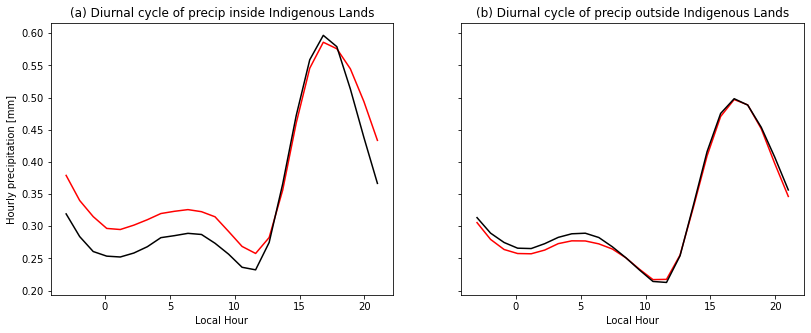

In [33]:
prec0_IL_diurnal = prec0_IL_areaave.values.reshape([62,24]).mean(axis=0)
prec1_IL_diurnal = prec1_IL_areaave.values.reshape([62,24]).mean(axis=0)
prec0_out_diurnal = prec0_out_areaave.values.reshape([62,24]).mean(axis=0)
prec1_out_diurnal = prec1_out_areaave.values.reshape([62,24]).mean(axis=0)

fig,axes = plt.subplots(1,2,figsize=(13.5,5),sharex=True,sharey=True)
axes = axes.ravel()  
axes[0].plot(np.linspace(-3,21,24),prec1_IL_diurnal,'-r')
axes[0].plot(np.linspace(-3,21,24),prec0_IL_diurnal,'-k')
axes[1].plot(np.linspace(-3,21,24),prec1_out_diurnal,'-r')
axes[1].plot(np.linspace(-3,21,24),prec0_out_diurnal,'-k')
axes[0].set_title('(a) Diurnal cycle of precip inside Indigenous Lands')
axes[1].set_title('(b) Diurnal cycle of precip outside Indigenous Lands')
axes[0].set_xlabel('Local Hour')
axes[1].set_xlabel('Local Hour')
axes[0].set_ylabel('Hourly precipitation [mm]')

### Is the diurnal cycle in precip related to diurnal cycle of surface temperature?

In [34]:
### Plot the height vs. time sections of potential temperature
import xarray
path = '/ocean/projects/ees210014p/xjliu/Amazon_exp/'
file = path+'post_processing/Amazon961x801/energy.200510.ctrl.nc'
with xarray.open_dataset(file,decode_times=False,
                         mask_and_scale='True') as ds0:
    TSK0 = ds0['TSK']

file1 = path+'post_processing/Amazon961x801/energy.200510.ILgrassland.nc'
with xarray.open_dataset(file1,decode_times=False,
                         mask_and_scale='True') as ds1:
    TSK1 = ds1['TSK']


Text(0, 0.5, 'Hourly precipitation [mm]')

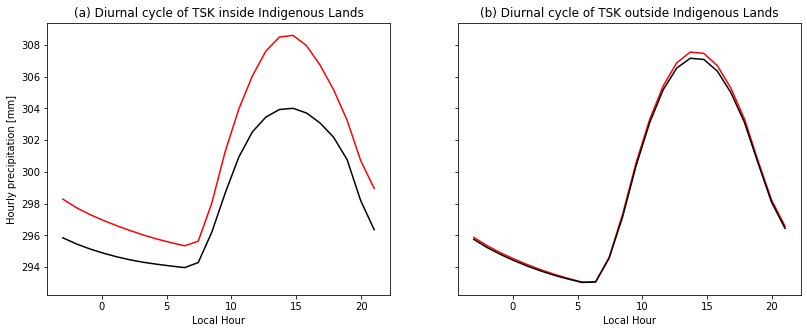

In [35]:
#### mask the ocean
TSK0_daily = TSK0.where(lu0<12,np.nan) # mask the ocean
TSK1_daily = TSK1.where(lu1<12,np.nan) # mask the ocean

### find the grids inside and outside of ILs and calculate the area-averaged precip
TSK0_IL = TSK0_daily.where(dif_lu>0,np.nan) # Inside IL
TSK1_IL = TSK1_daily.where(dif_lu>0,np.nan) # Inside IL
TSK0_out = TSK0_daily.where(dif_lu==0,np.nan) # outside IL
TSK1_out = TSK1_daily.where(dif_lu==0,np.nan) # outside IL

TSK0_areaave = TSK0_daily.mean(('south_north','west_east'))
TSK0_IL_areaave = TSK0_IL.mean(('south_north','west_east'))
TSK0_out_areaave = TSK0_out.mean(('south_north','west_east'))
TSK1_areaave = TSK1_daily.mean(('south_north','west_east'))
TSK1_IL_areaave = TSK1_IL.mean(('south_north','west_east'))
TSK1_out_areaave = TSK1_out.mean(('south_north','west_east'))

fig,axes = plt.subplots(1,2,figsize=(13.5,5),sharex=True,sharey=True)
axes = axes.ravel()  
axes[0].plot(np.linspace(-3,21,24),TSK1_IL_areaave,'-r')
axes[0].plot(np.linspace(-3,21,24),TSK0_IL_areaave,'-k')
axes[1].plot(np.linspace(-3,21,24),TSK1_out_areaave,'-r')
axes[1].plot(np.linspace(-3,21,24),TSK0_out_areaave,'-k')
axes[0].set_title('(a) Diurnal cycle of TSK inside Indigenous Lands')
axes[1].set_title('(b) Diurnal cycle of TSK outside Indigenous Lands')
axes[0].set_xlabel('Local Hour')
axes[1].set_xlabel('Local Hour')
axes[0].set_ylabel('Hourly precipitation [mm]')

# 2. Total (6-month accumulated) precipitation

## 2.1 Mean precipitation

In [4]:
files_control=['Amazon961x801_201509_201602/energyflux_d01_2016-02-28_00:00:00',
              'Amazon961x801_200509_200602/energyflux_d01_2006-02-28_00:00:00',
              'Amazon961x801_201009_201102/energyflux_d01_2011-02-28_00:00:00',
              'Amazon961x801_200809_200902/energyflux_d01_2009-02-28_00:00:00',
              'Amazon961x801_201109_201202/energyflux_d01_2012-02-28_00:00:00',
              'Amazon961x801_202009_202102/energyflux_d01_2021-02-28_00:00:00']
files_grassland=['Amazon961x801_201509_201602_ILgrassland/energyflux_d01_2016-02-28_00:00:00',
              'Amazon961x801_200509_200602_ILgrassland/energyflux_d01_2006-02-28_00:00:00',
              'Amazon961x801_201009_201102_ILgrassland/energyflux_d01_2011-02-28_00:00:00',
              'Amazon961x801_200809_200902_ILgrassland/energyflux_d01_2009-02-28_00:00:00',
              'Amazon961x801_201109_201202_ILgrassland/energyflux_d01_2012-02-28_00:00:00',
                'Amazon961x801_202009_202102_ILgrassland/energyflux_d01_2021-02-28_00:00:00']

In [5]:
ii=0
with xarray.open_dataset(path+files_control[ii],decode_times=False,
                         mask_and_scale='True') as ds0:
    prec0 = ds0['RAINNC'][-1,:,:]/181
with xarray.open_dataset(path+files_grassland[ii],decode_times=False,
                         mask_and_scale='True') as ds1:
    prec1 = ds1['RAINNC'][-1,:,:]/181

for ii in range(1,6):
    with xarray.open_dataset(path+files_control[ii],decode_times=False,
                         mask_and_scale='True') as ds0:
        tmp0 = ds0['RAINNC'][-1,:,:]/181
    prec0 = xarray.concat([prec0,tmp0],dim='member')

    with xarray.open_dataset(path+files_grassland[ii],decode_times=False,
                         mask_and_scale='True') as ds1:
        tmp1 = ds1['RAINNC'][-1,:,:]/181
    prec1 = xarray.concat([prec1,tmp1],dim='member')

### Mask out ocean and Savanna in the south
prec0 = prec0.where(lu0<17,np.nan) # mask the ocean
prec1 = prec1.where(lu1<17,np.nan)

prec0 = prec0.where(lu0!=9,np.nan) # mask Savanna; there is some fractions of savanna inside of Amazon but are also masked.
prec1 = prec1.where(lu1!=9,np.nan)

## 2.2 precipitation change

### 2.2.1 each individual member

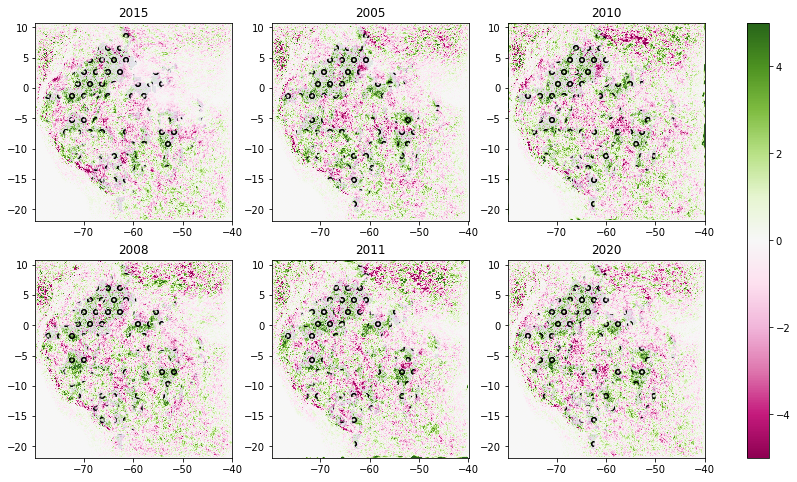

In [6]:
dif_prec = prec1 - prec0

fig, axs = plt.subplots(2,3,figsize=(15,8))
axs = axs.ravel()  

for ii in range(4):
    im=axs[ii].pcolormesh(lons,lats,dif_prec[ii,:,:],cmap='PiYG',
              vmin=-5,vmax=5)
    axs[ii].set_title(files_control[ii][14:18])
    axs[ii].contourf(lons,lats,IL_sel,hatches='o',alpha=0.1)

for ii in range(4,6):
    axs[ii].pcolormesh(lons,lats,dif_prec[ii,:,:],cmap='PiYG',
              vmin=-5,vmax=5)
    axs[ii].set_title(files_control[ii][14:18])
    axs[ii].contourf(lons,lats,IL_sel,hatches='o',alpha=0.1)
fig.colorbar(im,ax=axs[:6],orientation='vertical')

### 2.2.3 Ensemble mean

Text(0.5, 0, 'latitude')

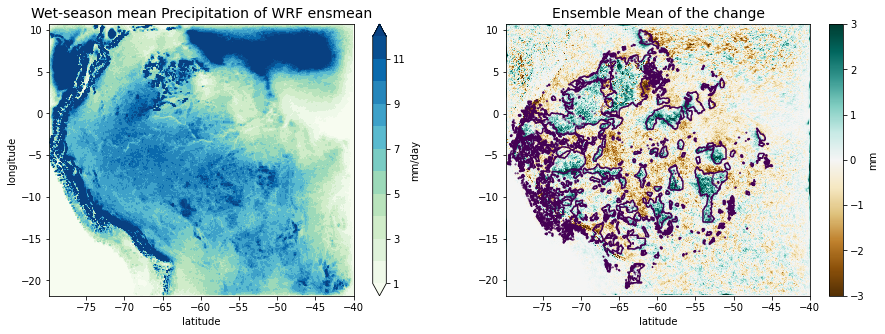

In [22]:
fig, axs = plt.subplots(1,2,figsize=(15,5))
im=axs[0].contourf(lons,lats,prec0.mean(axis=0),cmap='GnBu',
               levels=np.arange(1,13,1),extend='both')
fig.colorbar(im,ax=axs[0],label='mm/day')
axs[0].set_title('Wet-season mean Precipitation of WRF ensmean',fontsize=14)
axs[0].set_xlabel('latitude')
axs[0].set_ylabel('longitude')

im=axs[1].pcolormesh(lons,lats,prec1.mean(axis=0)-prec0.mean(axis=0),cmap='BrBG',
              vmin=-3,vmax=3)
fig.colorbar(im,ax=axs[1],label='mm')
axs[1].set_title('Ensemble Mean of the change',fontsize=14)
#axs[1].contourf(lons,lats,IL_sel,hatches='o',alpha=0.0)
axs[1].contour(lons,lats,dif_lu,vmin=8,vmax=8,linewidths=0.25)
axs[1].set_xlabel('latitude')
#axs[1].set_ylabel('longitude')

### 2.2.4 bar plot of precipitation inside and outside of ILs

In [7]:
### find the grids inside and outside of ILs and calculate the area-averaged precip
dif_lu = lu1 - lu0
prec0_IL = prec0.where(dif_lu>0,np.nan) # Inside IL
prec1_IL = prec1.where(dif_lu>0,np.nan) # Inside IL
prec0_out = prec0.where(dif_lu==0,np.nan) # outside IL
prec1_out = prec1.where(dif_lu==0,np.nan) # outside IL

prec0_areaave = prec0.mean(('south_north','west_east'))
prec0_IL_areaave = prec0_IL.mean(('south_north','west_east'))
prec0_out_areaave = prec0_out.mean(('south_north','west_east'))
prec1_areaave = prec1.mean(('south_north','west_east'))
prec1_IL_areaave = prec1_IL.mean(('south_north','west_east'))
prec1_out_areaave = prec1_out.mean(('south_north','west_east'))

<BarContainer object of 6 artists>

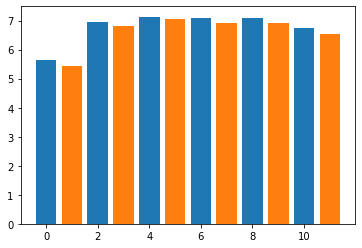

In [15]:
plt.bar(range(0,12,2),prec0_out_areaave)
plt.bar(range(1,13,2),prec1_out_areaave)

# 3. Change in precipitation intensity distribution

### Get the daily precipitation

In [16]:
files_control=['post_processing/Amazon961x801/precip.daily.ctrl.200509_200602.nc',
              'post_processing/Amazon961x801/precip.daily.ctrl.201009_201102.nc',
              'post_processing/Amazon961x801/precip.daily.ctrl.201509_201602.nc',
              'post_processing/Amazon961x801/precip.daily.ctrl.200809_200902.nc',
              'post_processing/Amazon961x801/precip.daily.ctrl.202009_202102.nc',
              'post_processing/Amazon961x801/precip.daily.ctrl.201109_201202.nc']
files_grassland=['post_processing/Amazon961x801/precip.daily.ILgrassland.200509_200602.nc',
              'post_processing/Amazon961x801/precip.daily.ILgrassland.201009_201102.nc',
              'post_processing/Amazon961x801/precip.daily.ILgrassland.201509_201602.nc',
                'post_processing/Amazon961x801/precip.daily.ILgrassland.200809_200902.nc',
                'post_processing/Amazon961x801/precip.daily.ILgrassland.202009_202102.nc',
                'post_processing/Amazon961x801/precip.daily.ILgrassland.201109_201202.nc']

In [18]:
ii=0
with xarray.open_dataset(path+files_control[ii],decode_times=False,
                         mask_and_scale='True') as ds0:
    prec0_daily = ds0['RAINNC'][:180,:,:]
with xarray.open_dataset(path+files_grassland[ii],decode_times=False,
                         mask_and_scale='True') as ds1:
    prec1_daily = ds1['RAINNC'][:180,:,:]

for ii in range(1,6):
    with xarray.open_dataset(path+files_control[ii],decode_times=False,
                         mask_and_scale='True') as ds0:
        tmp0 = ds0['RAINNC'][:180,:,:]
    prec0_daily = xarray.concat([prec0_daily,tmp0],dim='member')

    with xarray.open_dataset(path+files_grassland[ii],decode_times=False,
                         mask_and_scale='True') as ds1:
        tmp1 = ds1['RAINNC'][:180,:,:]
    prec1_daily = xarray.concat([prec1_daily,tmp1],dim='member')

prec0_daily = prec0_daily.where(lu0<12,np.nan) # mask the ocean
prec1_daily = prec1_daily.where(lu1<12,np.nan) # mask the ocean
prec0_daily = prec0_daily.where(lu0!=9,np.nan) # mask Savanna; there is some fractions of savanna inside of Amazon but are also masked.
prec1_daily = prec1_daily.where(lu1!=9,np.nan)

### bar plot of precipitaiton inside and outside of ILs

In [24]:
import copy
prec0_mon = copy.copy(prec0_daily[:,:6,:,:])
prec1_mon = copy.copy(prec1_daily[:,:6,:,:])
for ii in range(6):
    prec0_mon[:,ii,:,:]= prec0_daily[:,ii*30:(ii+1)*30,:,:].mean(axis=1)
    prec1_mon[:,ii,:,:]= prec1_daily[:,ii*30:(ii+1)*30,:,:].mean(axis=1)

prec0_mon_IL = prec0_mon.where(dif_lu>0,np.nan) # Inside IL
prec1_mon_IL = prec1_mon.where(dif_lu>0,np.nan) # Inside IL
prec0_mon_out = prec0_mon.where(dif_lu==0,np.nan) # outside IL
prec1_mon_out = prec1_mon.where(dif_lu==0,np.nan) # outside IL

prec0_mon_IL_areaave = prec0_mon_IL.mean(('south_north','west_east'))
prec0_mon_out_areaave = prec0_mon_out.mean(('south_north','west_east'))
prec1_mon_IL_areaave = prec1_mon_IL.mean(('south_north','west_east'))
prec1_mon_out_areaave = prec1_mon_out.mean(('south_north','west_east'))

In [25]:
prec0_mon_IL = prec0_mon.where(dif_lu>0,np.nan) # Inside IL
prec1_mon_IL = prec1_mon.where(dif_lu>0,np.nan) # Inside IL
prec0_mon_out = prec0_mon.where(dif_lu==0,np.nan) # outside IL
prec1_mon_out = prec1_mon.where(dif_lu==0,np.nan) # outside IL

prec0_mon_IL_areaave = prec0_mon_IL.mean(('south_north','west_east'))
prec0_mon_out_areaave = prec0_mon_out.mean(('south_north','west_east'))
prec1_mon_IL_areaave = prec1_mon_IL.mean(('south_north','west_east'))
prec1_mon_out_areaave = prec1_mon_out.mean(('south_north','west_east'))

<ErrorbarContainer object of 3 artists>

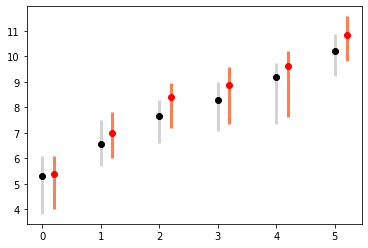

In [35]:
prec0_mon_IL_ensmean=prec0_mon_IL_areaave.mean(axis=0)
prec0_yerr_lower=prec0_mon_IL_areaave.mean(axis=0)-prec0_mon_IL_areaave.min(axis=0)
prec0_yerr_upper=prec0_mon_IL_areaave.max(axis=0)-prec0_mon_IL_areaave.mean(axis=0)
prec1_mon_IL_ensmean=prec1_mon_IL_areaave.mean(axis=0)
prec1_yerr_lower=prec1_mon_IL_areaave.mean(axis=0)-prec1_mon_IL_areaave.min(axis=0)
prec1_yerr_upper=prec1_mon_IL_areaave.max(axis=0)-prec1_mon_IL_areaave.mean(axis=0)

plt.errorbar(range(6),prec0_mon_IL_ensmean,[prec0_yerr_lower,prec0_yerr_upper],
            fmt='o', color='black',
             ecolor='lightgray', elinewidth=3, capsize=0)
plt.errorbar(np.linspace(0.2,5.2,6),prec1_mon_IL_ensmean,[prec1_yerr_lower,prec1_yerr_upper],
            fmt='o', color='red',
             ecolor='coral', elinewidth=3, capsize=0)

In [37]:
prec0_mon_IL_ensmean

<xarray.DataArray 'RAINNC' (time: 6)>
array([ 5.2875133,  6.5595055,  7.663183 ,  8.2709675,  9.177241 ,
       10.203111 ], dtype=float32)
Coordinates:
  * time     (time) float64 0.0 0.0 0.0 0.0 0.0 0.0

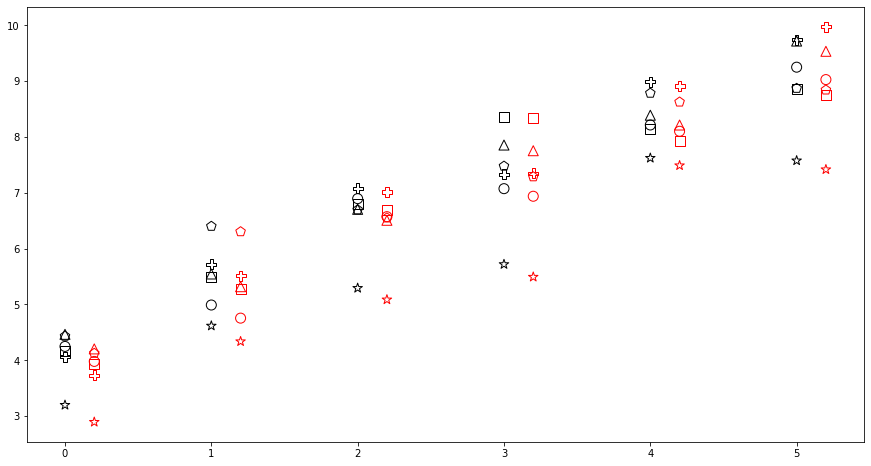

In [55]:
plt.figure(figsize=(15,8))
markers = ['s','P','*','^','o','p']
for ii in range(6):
    plt.scatter(range(6),prec0_mon_out_areaave[ii,:],marker=markers[ii],s=100,
               facecolor='none',edgecolors='k')
    plt.scatter(np.linspace(0.2,5.2,6),prec1_mon_out_areaave[ii,:],marker=markers[ii],s=100,
               facecolor='none',edgecolors='r')

### plot the monthly mean precipitation change

In [19]:
dif_prec_daily = prec1_daily - prec0_daily 
dif_prec_ensmean = dif_prec_daily.mean(axis=0)
dif_prec_Mon1 = dif_prec_ensmean[:30,:,:].mean(axis=0)
dif_prec_Mon2 = dif_prec_ensmean[30:60,:,:].mean(axis=0)
dif_prec_Mon3 = dif_prec_ensmean[60:90,:,:].mean(axis=0)
dif_prec_Mon4 = dif_prec_ensmean[90:120,:,:].mean(axis=0)
dif_prec_Mon5 = dif_prec_ensmean[120:150,:,:].mean(axis=0)
dif_prec_Mon6 = dif_prec_ensmean[150:,:,:].mean(axis=0)

In [20]:
dif_prec_Mon6

<xarray.DataArray 'RAINNC' (south_north: 800, west_east: 960)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]], dtype=float32)
Coordinates:
    XLAT     (south_north, west_east) float32 -21.86 -21.86 ... 10.72 10.72
    XLONG    (south_north, west_east) float32 -79.82 -79.78 ... -40.02 -39.98
Dimensions without coordinates: south_north, west_east

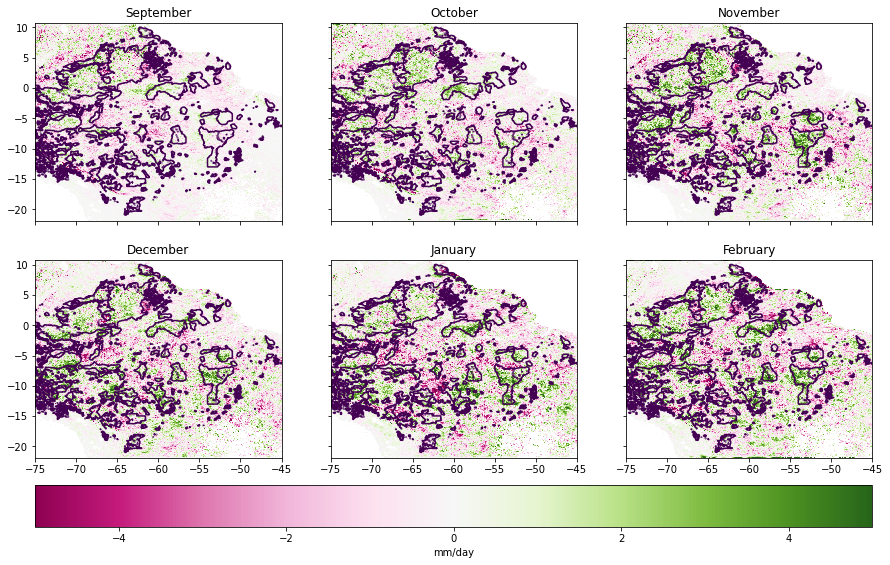

In [11]:
fig, axs = plt.subplots(2,3,figsize=(15,10),sharex=True,sharey=True)
axs = axs.ravel()  
axs[0].pcolormesh(lons,lats,dif_prec_Mon1,cmap='PiYG',
              vmin=-5,vmax=5)
axs[1].pcolormesh(lons,lats,dif_prec_Mon2,cmap='PiYG',
              vmin=-5,vmax=5)
axs[2].pcolormesh(lons,lats,dif_prec_Mon3,cmap='PiYG',
              vmin=-5,vmax=5)
axs[3].pcolormesh(lons,lats,dif_prec_Mon4,cmap='PiYG',
              vmin=-5,vmax=5)
axs[4].pcolormesh(lons,lats,dif_prec_Mon5,cmap='PiYG',
              vmin=-5,vmax=5)
im = axs[5].pcolormesh(lons,lats,dif_prec_Mon6,cmap='PiYG',
              vmin=-5,vmax=5)

months=['September','October','November','December','January','February']
for ii in range(6):
    axs[ii].contour(lons,lats,lu1-lu0,levels=[1])
    axs[ii].set_xlim([-75,-45])
    axs[ii].set_title(months[ii])
fig.colorbar(im,ax=axs[0:6],orientation='horizontal',pad=0.05,label='mm/day')
#fig.colorbar(im,ax=axs[:6],orientation='vertical')

### get precipitation inside and outside of ILs

In [8]:
### find the grids inside and outside of ILs and calculate the area-averaged precip
dif_lu = lu1 - lu0
prec0_IL = prec0_daily.where(dif_lu>0,np.nan) # Inside IL
prec1_IL = prec1_daily.where(dif_lu>0,np.nan) # Inside IL
prec0_out = prec0_daily.where(dif_lu==0,np.nan) # outside IL
prec1_out = prec1_daily.where(dif_lu==0,np.nan) # outside IL

prec0_areaave = prec0_daily.mean(('south_north','west_east'))
prec0_IL_areaave = prec0_IL.mean(('south_north','west_east'))
prec0_out_areaave = prec0_out.mean(('south_north','west_east'))
prec1_areaave = prec1_daily.mean(('south_north','west_east'))
prec1_IL_areaave = prec1_IL.mean(('south_north','west_east'))
prec1_out_areaave = prec1_out.mean(('south_north','west_east'))

### The distribution of ensemble mean precipitation inside and outside of IL

In [7]:
prec0_IL_ens = prec0_IL.mean(axis=0)
prec1_IL_ens = prec1_IL.mean(axis=0)
prec0_out_ens = prec0_out.mean(axis=0)
prec1_out_ens = prec1_out.mean(axis=0)

### Inside IL
bins_range = [0.0,1.0,10,30,70,150,1000]
hist0,bins = np.histogram(prec0_IL_ens.values.flatten(),bins=bins_range)
hist1,bins = np.histogram(prec0_out_ens.values.flatten(),bins=bins_range)

Text(0.5, 1.0, 'Outside of Indigenous Lands')

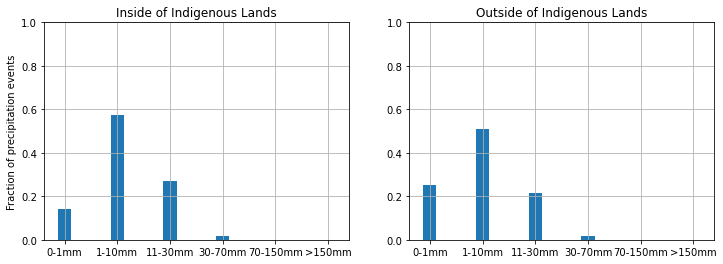

In [204]:
fig, axs = plt.subplots(1,2,figsize=(12,4),sharex=True)
axs = axs.ravel()  

axs[0].bar(np.arange(0,12,2),hist0[:]/hist0[:].sum(),width=0.5)
axs[1].bar(np.arange(0,12,2),hist1[:]/hist1[:].sum(),width=0.5)
axs[0].set_xticks(np.arange(0,12,2),['0-1mm/n (dry)','1-10mm','11-30mm','30-70mm','70-150mm','>150mm'])
axs[1].set_xticks(np.arange(0,12,2),['0-1mm','1-10mm','11-30mm','30-70mm','70-150mm','>150mm'])
for ii in range(2):
    axs[ii].set_ylim([0,1])
    axs[ii].grid()
axs[0].set_ylabel('Fraction of precipitation events')
axs[0].set_title('Inside of Indigenous Lands')
axs[1].set_title('Outside of Indigenous Lands')


### pdf of the daily precipitation

In [9]:
members = ['Member1','Member2','Member3','Member4','Member5','Member6']
months = ['Sept','Oct','Nov','Dec','Jan','Feb']

hist1_IL={}
hist0_IL={}
hist1_out={}
hist0_out={}

for mem in members:
    for mon in months:
        hist0_IL.setdefault(mem, {})[mon] = 0
        hist1_IL.setdefault(mem, {})[mon] = 0
        hist0_out.setdefault(mem, {})[mon] = 0
        hist1_out.setdefault(mem, {})[mon] = 0

In [10]:
### Merge plots of all members into one single plot
bins_range = [0.0,1.0,10,30,70,150,1000]
for member in range(6):
    for tt in range(6):
        hist0_IL[members[member]][months[tt]] = np.histogram(prec0_IL[member,tt*30:(tt+1)*30,:,:].values.flatten(),
                                                             bins=bins_range)[0]
        hist1_IL[members[member]][months[tt]] = np.histogram(prec1_IL[member,tt*30:(tt+1)*30,:,:].values.flatten(),
                                                             bins=bins_range)[0]
        hist0_out[members[member]][months[tt]] = np.histogram(prec0_out[member,tt*30:(tt+1)*30,:,:].values.flatten(),
                                                             bins=bins_range)[0]
        hist1_out[members[member]][months[tt]] = np.histogram(prec1_out[member,tt*30:(tt+1)*30,:,:].values.flatten(),
                                                             bins=bins_range)[0]

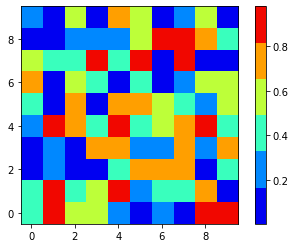

In [119]:
cmap = mpl.cm.get_cmap("jet")
cmap_new = cmap(np.linspace(0.1, 0.9, 6))
newcmp = mcolors.ListedColormap(cmap_new)

mat = np.random.random((10,10))
plt.imshow(mat, origin="lower", cmap=newcmp, interpolation='nearest')
plt.colorbar()
plt.show()

Text(0.5, 1.0, 'Outside IL')

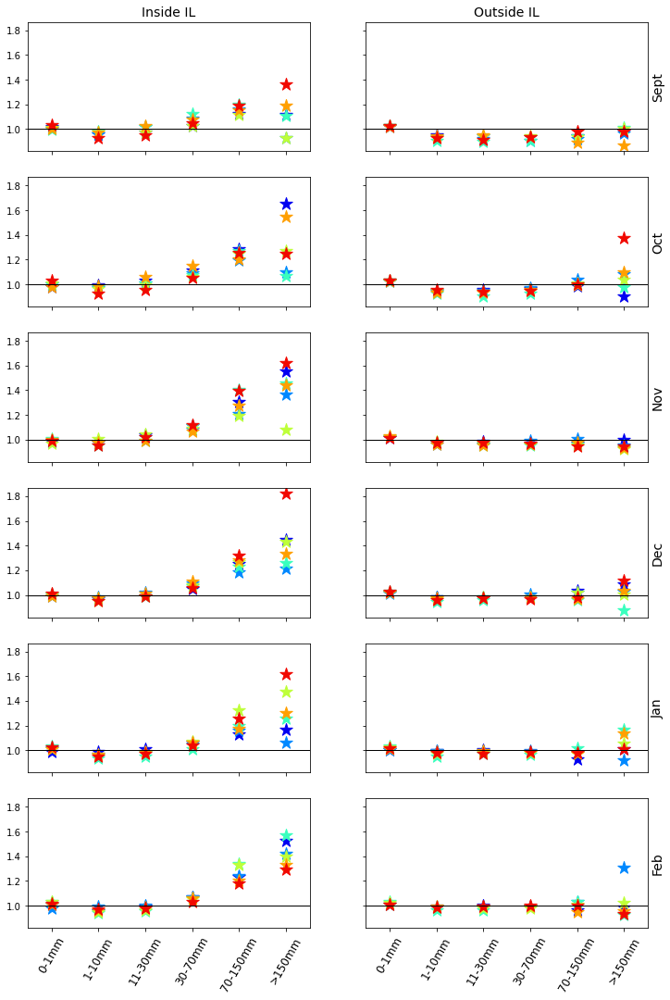

In [129]:
markers=['P','h','X','^','s','*']
fig, axs = plt.subplots(6,2,figsize=(12,18),sharex=True,sharey=True)

for ii in range(6):
    tt = 0
    for mem in members:
        axs[ii,0].scatter(np.arange(0,6),hist1_IL[mem][months[ii]]/hist0_IL[mem][months[ii]],s=200,marker='*',
                          color=cmap_new[tt])
                          #marker=markers[tt],
                         #facecolor='none',edgecolors='k')
        axs[ii,0].plot([-0.5,5.5],[1, 1],'-k',linewidth=1)
        axs[ii,1].scatter(np.arange(0,6),hist1_out[mem][months[ii]]/hist0_out[mem][months[ii]],s=200,marker='*',
                          color=cmap_new[tt])
        axs[ii,1].plot([-0.5,5.5],[1, 1],'-k',linewidth=1)
        axs[ii,1].yaxis.set_label_position("right")
        axs[ii,1].set_ylabel(months[ii],fontsize=14)
        axs[ii,0].set_xlim([-0.5,5.5])
        axs[ii,1].set_xlim([-0.5,5.5])
        tt+=1
axs[5,0].set_xticks(range(6),['0-1mm','1-10mm','11-30mm','30-70mm','70-150mm','>150mm'],rotation=60,fontsize=12)
axs[5,1].set_xticks(range(6),['0-1mm','1-10mm','11-30mm','30-70mm','70-150mm','>150mm'],rotation=60,fontsize=12)
axs[0,0].set_title('Inside IL',fontsize=14)
axs[0,1].set_title('Outside IL',fontsize=14)


#### Old plot

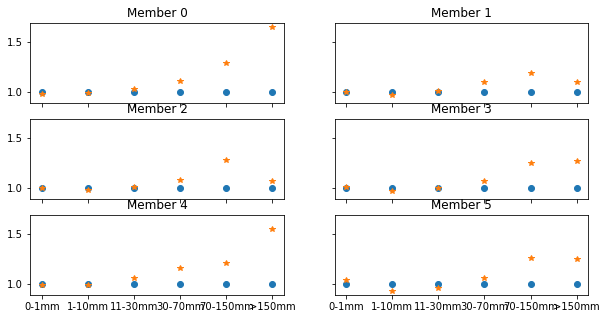

In [9]:
### Inside IL
fig, axs = plt.subplots(3,2,figsize=(10,5),sharex=True,sharey=True)
axs = axs.ravel()  

tt1 = 30
tt2 = 60
bins_range = [0.0,1.0,10,30,70,150,1000]
for member in range(6):
    hist0,bins = np.histogram(prec0_IL[member,tt1:tt2,:,:].values.flatten(),bins=bins_range)
    hist1,bins = np.histogram(prec1_IL[member,tt1:tt2,:,:].values.flatten(),bins=bins_range)
    axs[member].plot(hist0[:]/hist0[:],'o',label='Control')
    axs[member].plot(hist1[:]/hist0[:],'*',label='ILgrassland')
    axs[member].set_title('Member '+str(member))
axs[2].set_xticks(range(6),['0-1mm','1-10mm','11-30mm','30-70mm','70-150mm','>150mm'])
axs[3].set_xticks(range(6),['0-1mm','1-10mm','11-30mm','30-70mm','70-150mm','>150mm'])

### Statistical significance test of the differences between control and ILgrassland 

In [238]:
from scipy import stats
from scipy.stats import fisher_exact
drydays = np.array([[hist1[1],hist1[[0,2,3,4,5]].sum()], [hist0[1], hist0[[0,2,3,4,5]].sum()]])
stats.chi2_contingency(drydays)


(9632.826708378036,
 0.0,
 1,
 array([[ 5033312., 14482648.],
        [ 5033312., 14482648.]]))

In [243]:
drydays = np.array([[hist1[5],hist0[5]], [hist1[[0,1,2,3,4]].sum(), hist0[[0,1,2,3,4]].sum()]])
res = fisher_exact(drydays)
res


(1.5000129435932854, 2.8794e-320)

#### outside IL

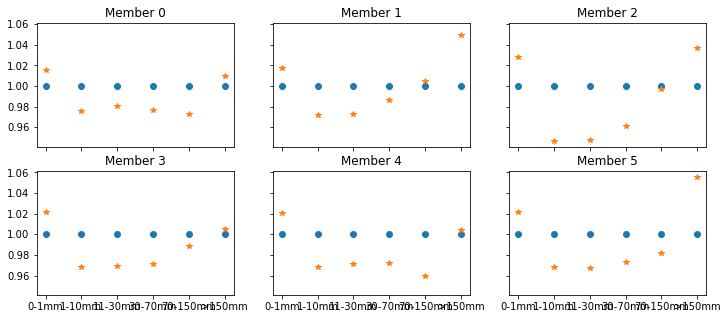

In [16]:
fig, axs = plt.subplots(2,3,figsize=(12,5),sharex=True,sharey=True)
axs = axs.ravel()  

bins_range = [0.0,1.0,10,30,70,150,1000]
for member in range(6):
    hist0,bins = np.histogram(prec0_out[member,0:,:,:].values.flatten(),bins=bins_range)
    hist1,bins = np.histogram(prec1_out[member,0:,:,:].values.flatten(),bins=bins_range)
    axs[member].plot(hist0[:]/hist0[:],'o',label='Control')
    axs[member].plot(hist1[:]/hist0[:],'*',label='ILgrassland')
    axs[member].set_title('Member '+str(member))
axs[2].set_xticks(range(6),['0-1mm','1-10mm','11-30mm','30-70mm','70-150mm','>150mm'])
axs[3].set_xticks(range(6),['0-1mm','1-10mm','11-30mm','30-70mm','70-150mm','>150mm'])

## Find the onset of rainy season, defined as the day when precip > 20mm.

In [47]:
flag = prec1_daily[:,:,:,:]>20
tmp = np.zeros(flag.shape)
for ii in range(180):
    tmp[:,ii,:,:]=flag[:,ii,:,:].where(flag[:,ii,:,:]==False,ii, 0)
tmp2=np.where(tmp==0,np.nan,tmp)
onset1 = np.nanmin(tmp2,axis=1)

flag0 = prec0_daily[:,:,:,:]>20
tmp0 = np.zeros(flag0.shape)
for ii in range(180):
    tmp0[:,ii,:,:]=flag0[:,ii,:,:].where(flag0[:,ii,:,:]==False,ii, 0)
tmp0=np.where(tmp0==0,np.nan,tmp0)
onset0 = np.nanmin(tmp0,axis=1)

/tmp/ipykernel_82104/1431709852.py:6: RuntimeWarning: All-NaN slice encountered
  onset1 = np.nanmin(tmp2,axis=1)
/tmp/ipykernel_82104/1431709852.py:13: RuntimeWarning: All-NaN slice encountered
  onset0 = np.nanmin(tmp0,axis=1)


### Take the ensemble mean first and then onset dates

In [61]:
prec1_ens = prec1_daily[:,:,:,:].mean(axis=0)
prec0_ens = prec0_daily[:,:,:,:].mean(axis=0)

flag = prec0_ens>20
tmp = np.zeros(flag.shape)
for ii in range(180):
    tmp[ii,:,:]=flag[ii,:,:].where(flag[ii,:,:]==False,ii, 0)
tmp2=np.where(tmp==0,np.nan,tmp)
onset0 = np.nanmin(tmp2,axis=0)

flag1 = prec1_ens>20
tmp0 = np.zeros(flag1.shape)
for ii in range(180):
    tmp0[ii,:,:]=flag1[ii,:,:].where(flag1[ii,:,:]==False,ii, 0)
tmp0=np.where(tmp0==0,np.nan,tmp0)
onset1 = np.nanmin(tmp0,axis=0)

/tmp/ipykernel_82104/2329454472.py:9: RuntimeWarning: All-NaN slice encountered
  onset0 = np.nanmin(tmp2,axis=0)
/tmp/ipykernel_82104/2329454472.py:16: RuntimeWarning: All-NaN slice encountered
  onset1 = np.nanmin(tmp0,axis=0)


In [118]:
from scipy.ndimage import uniform_filter1d
prec0_ens_pentad = uniform_filter1d(prec0_ens,size=5,axis=0)
prec1_ens_pentad = uniform_filter1d(prec1_ens,size=5,axis=0)
prec0_ens_Xave = (prec0_ens[:,0:-5,:]+prec0_ens[:,1:-4,:]+prec0_ens[:,2:-3,:]+prec0_ens[:,3:-2,:]+prec0_ens[:,4:-1,:])/5
prec0_ens_XYave = (prec0_ens_Xave[:,:,0:-5]+prec0_ens_Xave[:,:,1:-4]+prec0_ens_Xave[:,:,2:-3]+prec0_ens_Xave[:,:,3:-2]
                   +prec0_ens_Xave[:,:,4:-1])/5
prec1_ens_Xave = (prec1_ens[:,0:-5,:]+prec1_ens[:,1:-4,:]+prec1_ens[:,2:-3,:]+prec1_ens[:,3:-2,:]+prec1_ens[:,4:-1,:])/5
prec1_ens_XYave = (prec1_ens_Xave[:,:,0:-5]+prec1_ens_Xave[:,:,1:-4]+prec1_ens_Xave[:,:,2:-3]+prec1_ens_Xave[:,:,3:-2]
                   +prec1_ens_Xave[:,:,4:-1])/5

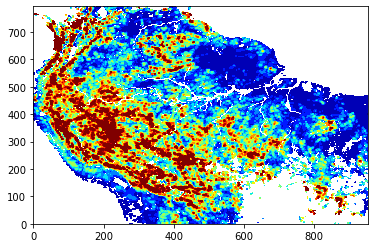

In [140]:
plt.contourf(prec0_ens_XYave[90,:,:],cmap='jet',extend='both',levels=np.arange(0,21,2))

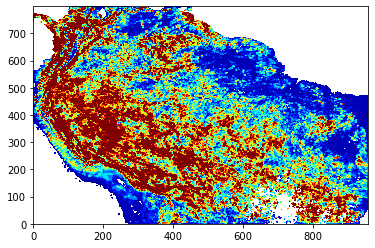

In [141]:
plt.contourf(prec0_ens[90,:,:],cmap='jet',extend='both',levels=np.arange(0,21,2))

/tmp/ipykernel_82104/4000657585.py:7: RuntimeWarning: All-NaN slice encountered
  onset0 = np.nanmin(tmp2,axis=0)
/tmp/ipykernel_82104/4000657585.py:14: RuntimeWarning: All-NaN slice encountered
  onset1 = np.nanmin(tmp0,axis=0)


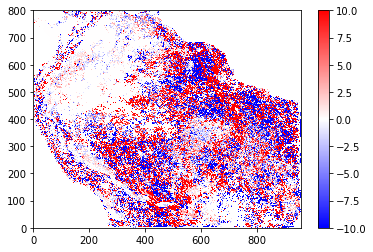

In [184]:
## calculte the onset
flag = prec0_ens_pentad>5
tmp = np.zeros(flag.shape)
for ii in range(180):
    tmp[ii,:,:]=np.where(flag[ii,:,:]==False,0,ii)
tmp2=np.where(tmp==0,np.nan,tmp)
onset0 = np.nanmin(tmp2,axis=0)

flag1 = prec1_ens_pentad>5
tmp0 = np.zeros(flag1.shape)
for ii in range(180):
    tmp0[ii,:,:]=np.where(flag1[ii,:,:]==False,0,ii)
tmp0=np.where(tmp0==0,np.nan,tmp0)
onset1 = np.nanmin(tmp0,axis=0)

plt.pcolormesh(onset1-onset0,cmap='bwr',vmin=-10,vmax=10)
plt.colorbar()

In [163]:
## calculte the end
flag = prec0_ens_pentad<5   #finding the precip < 5
tmp = np.zeros(flag.shape)
for ii in range(180):
    tmp[ii,:,:]=np.where(flag[ii,:,:]==False,0,ii)  # label using the day all the days that has precip < 5
tmp2=np.where(tmp<onset0,np.nan,tmp)   # The end date has to be greater than onset date
end0 = np.nanmin(tmp2,axis=0)


/tmp/ipykernel_82104/2500249060.py:7: RuntimeWarning: All-NaN slice encountered
  end0 = np.nanmin(tmp2,axis=0)


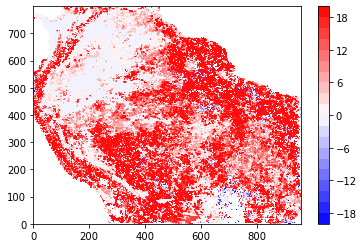

In [158]:
plt.contourf(onset1-onset0,cmap='bwr',levels=np.arange(-20,21,2))
plt.colorbar()

/tmp/ipykernel_82104/3763331389.py:15: UserWarning: shading value 'gouroud' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  axs[2].pcolormesh(lons,lats,onset0_out,vmin=0,vmax=100,cmap=cmap1,shading='gouroud')
/tmp/ipykernel_82104/3763331389.py:16: UserWarning: shading value 'gouroud' not in list of valid values ['gouraud', 'nearest', 'flat', 'auto']. Setting shading='auto'.
  im=axs[3].pcolormesh(lons,lats,onset1_out,vmin=0,vmax=100,cmap=cmap1,shading='gouroud')


Text(0.5, 1.0, 'Onset of Rainy season for Deforestation Simul')

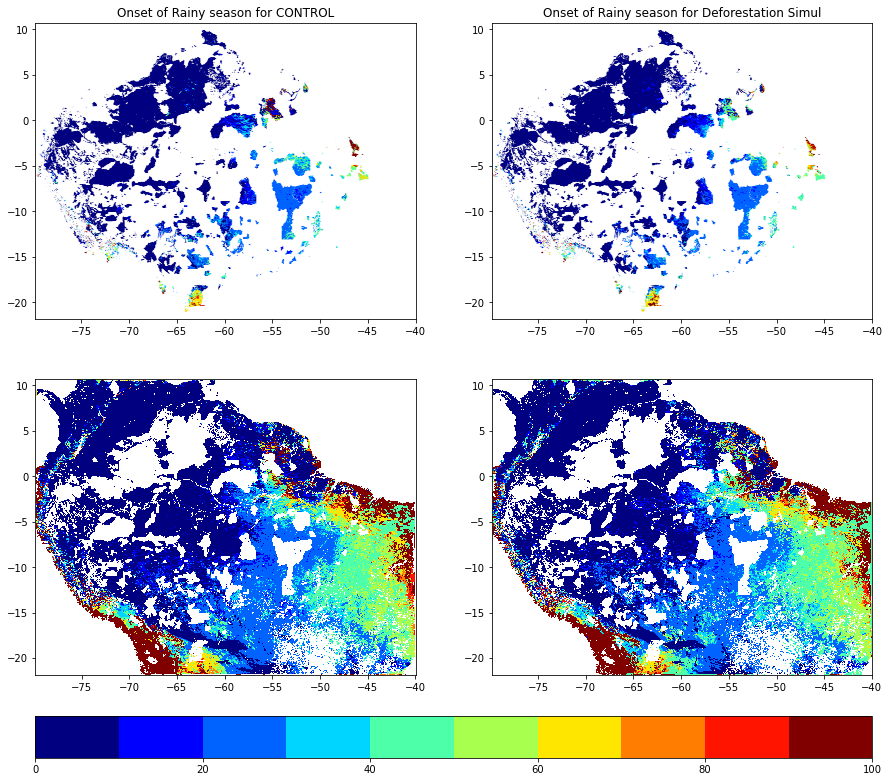

In [153]:
dif_lu = lu1 - lu0

onset0_IL = np.where(dif_lu>0,onset0,np.nan) # Inside IL
onset0_out = np.where(dif_lu==0,onset0,np.nan) # Inside IL
onset1_IL = np.where(dif_lu>0,onset1,np.nan) # Inside IL
onset1_out = np.where(dif_lu==0,onset1,np.nan) # Inside IL

cmap1 = cm.get_cmap("jet",lut=10)
cmap1.set_bad("w")

fig, axs = plt.subplots(2,2,figsize=(15,15))
axs = axs.ravel()
axs[0].pcolormesh(lons,lats,onset0_IL,vmin=0,vmax=100,cmap=cmap1,shading='gouraud')
im=axs[1].pcolormesh(lons,lats,onset1_IL,vmin=0,vmax=100,cmap=cmap1,shading='gouraud')
axs[2].pcolormesh(lons,lats,onset0_out,vmin=0,vmax=100,cmap=cmap1,shading='gouroud')
im=axs[3].pcolormesh(lons,lats,onset1_out,vmin=0,vmax=100,cmap=cmap1,shading='gouroud')
fig.colorbar(im,ax=axs[:],orientation='horizontal',pad=0.05)
axs[0].set_title('Onset of Rainy season for CONTROL')
axs[1].set_title('Onset of Rainy season for Deforestation Simul')

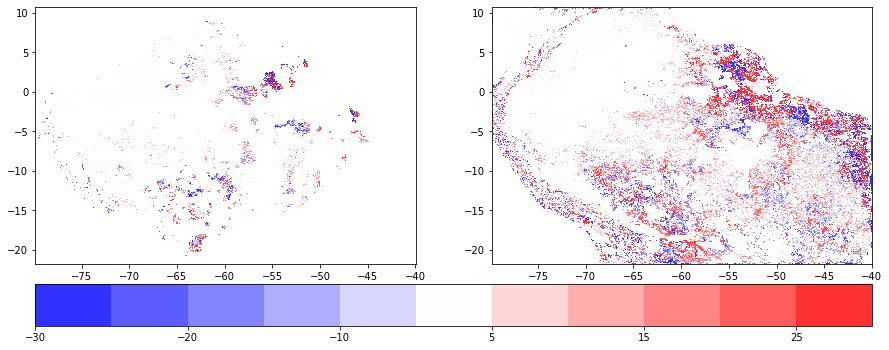

In [154]:
dif_lu = lu1 - lu0
dif_onset = onset1 - onset0
dif_onset_IL = np.where(dif_lu>0,dif_onset,np.nan) # Inside IL
dif_onset_out = np.where(dif_lu==0,dif_onset,np.nan) # Inside IL
#dif_onset_out = np.where(np.abs(dif_onset_out)>1,dif_onset,np.nan)

bounds = np.array([-30,-25,-20,-15,-10,-5,5, 10,15,20,25,30])
import matplotlib.colors as colors
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
from matplotlib.colors import BoundaryNorm
bwr_big = mpl.colormaps['bwr']
newcmp = ListedColormap(bwr_big(np.linspace(0.1, 0.9, 11)))
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=11)

fig, axs = plt.subplots(1,2,figsize=(15,6))
axs = axs.ravel()
im2 = axs[0].pcolormesh(lons,lats,dif_onset_IL,norm=norm,cmap=newcmp,shading='auto',edgecolors='none')
im2 = axs[1].pcolormesh(lons,lats,dif_onset_out,norm=norm,cmap=newcmp,shading='auto',edgecolors='none')
fig.colorbar(im2,ax=axs[:],orientation='horizontal',pad=0.06)


In [41]:
dif_onset_IL[dif_onset_IL!=0].shape

(760703,)

#### PDF of change in onset dates

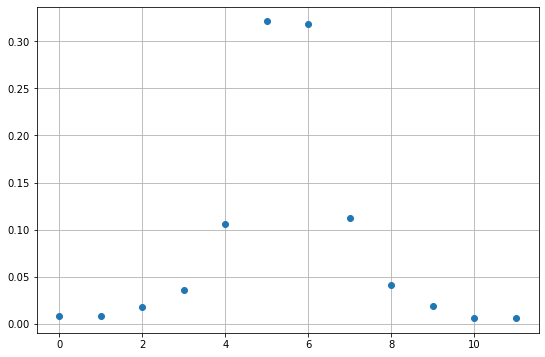

In [54]:
dif_onset = onset1 - onset0
dif_onset_IL = np.where(dif_lu>0,dif_onset,np.nan) # Inside IL
dif_onset_out = np.where(dif_lu==0,dif_onset,np.nan) # Inside IL

ii=5
data = dif_onset_IL[ii,:,:]
data = data[data!=0]
range1 = np.append([-500],np.linspace(-50,50,11))
#bins_range = np.append(range1,[500])
#bins_range = [-100,-10,-8,-6,-4,-2,0,2,4,6,8,10,100]
range1 = np.append([-500],np.linspace(-50,50,11))
bins_range = np.append(range1,[500])
hist0,bins = np.histogram(data,bins=bins_range)

#fig.figsize((12,9))
plt.figure(figsize=(9,6))
plt.plot(np.arange(12),hist0[:]/hist0.sum(),'o',label='Control')
#bins_label=['-500:-30','-30:-25','-25:-20','-20:-15','-15:-10','-10:-5','-5:0','0:5','5:10','10:15','15:20','20:25','25:30','30:500']
#plt.xticks(np.arange(14),bins_label)
plt.grid()

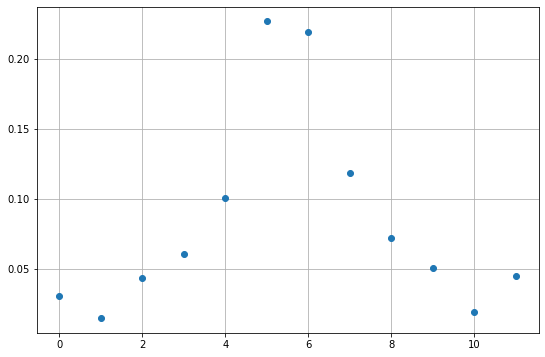

In [60]:
ii=0
data_out = dif_onset_out[ii,:,:]
data_out = data_out[data_out!=0]
#range1 = np.append([-500],np.linspace(-30,30,13))
#bins_range = np.append(range1,[500])
hist0,bins = np.histogram(data_out,bins=bins_range)
#fig.figsize((12,9))
plt.figure(figsize=(9,6))
plt.plot(np.arange(12),hist0[:]/hist0.sum(),'o',label='Control')
#bins_label=['-500:-30','-30:-25','-25:-20','-20:-15','-15:-10','-10:-5','-5:0','0:5','5:10','10:15','15:20','20:25','25:30','30:500']
#plt.xticks(np.arange(14),bins_label)
plt.grid()

In [46]:
hist0

array([23002, 11676, 16795, 26631, 37203, 52595, 48627, 40464, 32589,
       20652, 14032, 28307])

#### Interpolated results

ValueError: operands could not be broadcast together with shapes (800,960) (80,96) () 

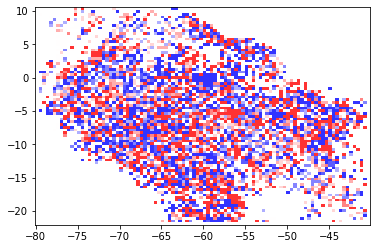

In [18]:
import numpy as np
from scipy import interpolate
z = dif_onset
x = lons[0,:]
y = lats[:,0]
from scipy.interpolate import RegularGridInterpolator
interp = RegularGridInterpolator((y, x), z, method='linear',
                                 bounds_error=False, fill_value=None)

xx = lons[::10,::10]
yy = lats[::10,::10]
znew = interp((yy,xx))
plt.pcolormesh(xx,yy,znew,norm=norm,cmap=newcmp,shading='nearest',edgecolors='none')

znew_IL = np.where(dif_lu>0,znew,np.nan) # Inside IL
znew_out = np.where(dif_lu==0,znew,np.nan) # Inside IL
#dif_onset_out = np.where(np.abs(dif_onset_out)>1,dif_onset,np.nan)

fig, axs = plt.subplots(1,2,figsize=(15,6))
axs = axs.ravel()
im2 = axs[0].pcolormesh(znew_IL,norm=norm,cmap=newcmp,shading='nearest',edgecolors='none')
im2 = axs[1].pcolormesh(znew_out,norm=norm,cmap=newcmp,shading='nearest',edgecolors='none')
fig.colorbar(im2,ax=axs[:],orientation='horizontal',pad=0.06)


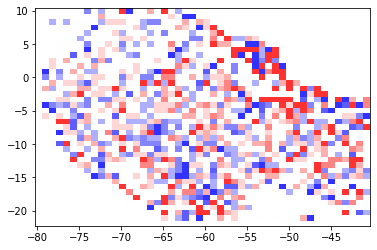

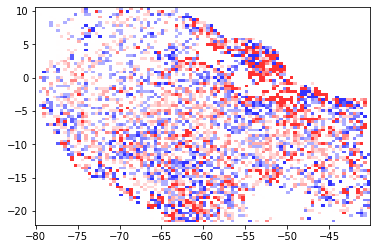

In [277]:
GD1 = interpolate.griddata((lons[0,:], lats[:,0]), znew.ravel(),
                          (lons,lats),
                             method='cubic')

ValueError: shape mismatch: objects cannot be broadcast to a single shape.  Mismatch is between arg 0 with shape (960,) and arg 1 with shape (800,).

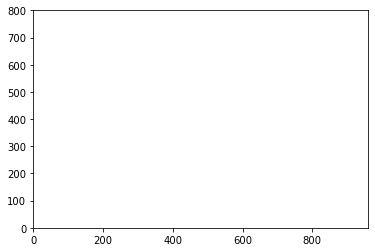

In [265]:
x = np.arange(0, array.shape[1])
y = np.arange(0, array.shape[0])
#mask invalid values
array = np.ma.masked_invalid(array)
xx, yy = np.meshgrid(x, y)
#get only the valid values
x1 = xx[~array.mask]
y1 = yy[~array.mask]
newarr = array[~array.mask]

GD1 = interpolate.griddata((x1, y1), newarr.ravel(),
                          (xx, yy),
                             method='cubic')

In [264]:
znew = f(lons[0,:], lats[:,0])

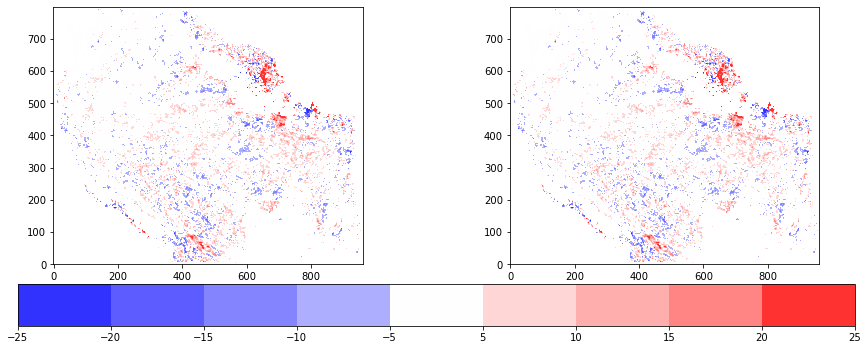

In [236]:
import matplotlib.colors as colors
bounds = np.array([-25,-20,-15,-10,-5,5,10,15,20,25])
from matplotlib.colors import ListedColormap, LinearSegmentedColormap
bwr_big = mpl.colormaps['bwr']
newcmp = ListedColormap(bwr_big(np.linspace(0.1, 0.9, 11)))
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=11)

ii=5
fig, axs = plt.subplots(1,2,figsize=(15,6))
axs = axs.ravel()
im2 = axs[0].imshow(dif_onset.mean(axis=0),norm=norm,cmap=newcmp,interpolation='bilinear',origin='lower')
#axs[0].contourf(IL_sel,colors='k',alpha=0.91)

im2 = axs[1].imshow(dif_onset.mean(axis=0),norm=norm,cmap=newcmp,interpolation='bilinear',origin='lower')
fig.colorbar(im2,ax=axs[:],orientation='horizontal',pad=0.06)


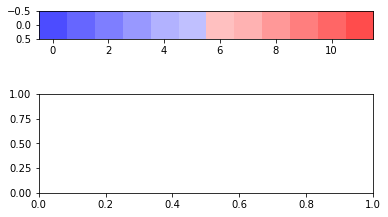

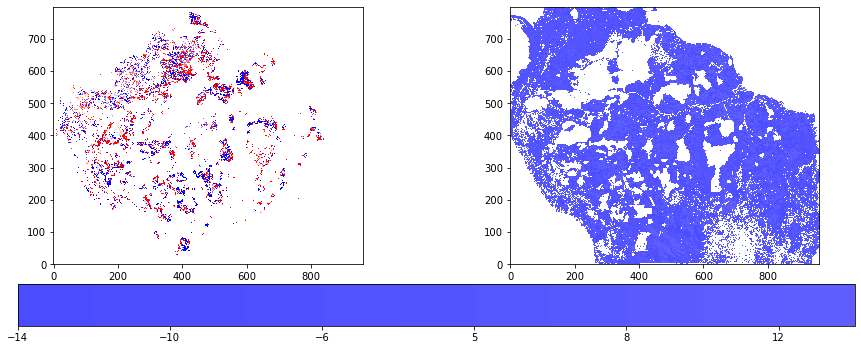

In [173]:
cmap1 = cm.get_cmap("bwr",lut=13)
cmap1.set_bad("w")

bounds = np.array([-14,-12,-10,-8,-6,-5,5,6,8,10,12,14])

from matplotlib.colors import ListedColormap, LinearSegmentedColormap
norm = colors.BoundaryNorm(boundaries=bounds, ncolors=14)
bwr_big = mpl.colormaps['bwr']
newcmp = ListedColormap(bwr_big(np.linspace(0.15, 0.85, 256)))

data = [bounds] #[np.arange(0,12)]

fig, (ax1, ax2) = plt.subplots(nrows=2)

ax1.imshow(data, cmap=newcmp)

plt.show()

import matplotlib.colors as colors
bounds = np.array([-14,-12,-10,-8,-6,-5,5,6,8,10,12,14])
#bounds = np.array([-20,-16,-1,-6,-4,4,6,8,10,12,14])


ii=0
fig, axs = plt.subplots(1,2,figsize=(15,6))
axs = axs.ravel()
im2 = axs[0].imshow(dif_onset_IL[ii,:,:],norm=norm,cmap=cmap1,interpolation='none',origin='lower')
im2 = axs[1].imshow(dif_onset_out[ii,:,:],norm=norm,cmap=newcmp,interpolation='none',origin='lower')
fig.colorbar(im2,ax=axs[:],orientation='horizontal',pad=0.06)


### It is hard to tell from the spatial map the change in onset days. Use the faction of advance or delay instead.
#### Specifically, subgroup them into change in onset of all grids, grids inside IL, and grids outside of IL. 

In [23]:
for ii in range(6):
    NofAdvance = np.sum(dif_onset[ii,:,:]<0)
    NofDelay = np.sum(dif_onset[ii,:,:]>0)
    print(str(ii)+'Number of Advance is: '+str(NofAdvance))
    print(str(ii)+'Number of Delay is: '+str(NofDelay/(NofAdvance+NofDelay)))

0Number of Advance is: 210982
0Number of Delay is: 0.515087578977368
1Number of Advance is: 210747
1Number of Delay is: 0.5230910925951908
2Number of Advance is: 210447
2Number of Delay is: 0.5301473543201608
3Number of Advance is: 214053
3Number of Delay is: 0.5221796606083334
4Number of Advance is: 206336
4Number of Delay is: 0.5319523459545781
5Number of Advance is: 215317
5Number of Delay is: 0.5186887371327022


In [24]:
dif_onset_IL = np.where(dif_lu>0,dif_onset,np.nan) # Inside IL
dif_onset_out = np.where(dif_lu==0,dif_onset,np.nan) # Inside IL

for ii in range(6):
    NofAdvance = np.sum(dif_onset_IL[ii,:,:]<0)
    NofDelay = np.sum(dif_onset_IL[ii,:,:]>0)
    print(str(ii)+'Number of Advance inside Indigenous Lands is: '+str(NofAdvance))
    print(str(ii)+'Number of Delay inside Indigenous Lands is: '+str(NofDelay/(NofAdvance+NofDelay)))

0Number of Advance inside Indigenous Lands is: 45439
0Number of Delay inside Indigenous Lands is: 0.48230643029667775
1Number of Advance inside Indigenous Lands is: 45128
1Number of Delay inside Indigenous Lands is: 0.4861424244494546
2Number of Advance inside Indigenous Lands is: 47475
2Number of Delay inside Indigenous Lands is: 0.4886088221037324
3Number of Advance inside Indigenous Lands is: 45081
3Number of Delay inside Indigenous Lands is: 0.5133375794803148
4Number of Advance inside Indigenous Lands is: 47152
4Number of Delay inside Indigenous Lands is: 0.477406984605495
5Number of Advance inside Indigenous Lands is: 45265
5Number of Delay inside Indigenous Lands is: 0.5030684275818156


In [25]:
dif_onset_out = np.where(dif_lu==0,dif_onset,np.nan) # Inside IL

for ii in range(6):
    NofAdvance = np.sum(dif_onset_out[ii,:,:]<0)
    NofDelay = np.sum(dif_onset_out[ii,:,:]>0)
    print(str(ii)+'Number of Advance outside Indigenous Lands is: '+str(NofAdvance))
    print(str(ii)+'Number of Delay outside Indigenous Lands is: '+str(NofDelay/(NofAdvance+NofDelay)))

0Number of Advance outside Indigenous Lands is: 165539
0Number of Delay outside Indigenous Lands is: 0.5233764065001324
1Number of Advance outside Indigenous Lands is: 165616
1Number of Delay outside Indigenous Lands is: 0.5322586111456298
2Number of Advance outside Indigenous Lands is: 162968
2Number of Delay outside Indigenous Lands is: 0.5410127865712837
3Number of Advance outside Indigenous Lands is: 168970
3Number of Delay outside Indigenous Lands is: 0.5244822549734197
4Number of Advance outside Indigenous Lands is: 159180
4Number of Delay outside Indigenous Lands is: 0.5459951570535034
5Number of Advance outside Indigenous Lands is: 170049
5Number of Delay outside Indigenous Lands is: 0.5226828720597316


# Stop here

### Fraction of area of precip increase/decrease

In [31]:
dif_prec_IL = prec1_IL - prec0_IL
#np.count_nonzero(dif_prec_IL.values==0)
dif_prec_out = prec1_out - prec0_out
#np.count_nonzero(dif_prec_out.values==0)
#np.sum(np.isnan(prec1_IL.values)==0)

In [35]:
frac1=np.sum(dif_prec_IL>0,axis=1)/np.sum(np.isnan(prec1_IL.values)==0,axis=1)
frac2=np.sum(dif_prec_out>0,axis=1)/np.sum(np.isnan(prec1_out.values)==0,axis=1)
size1 = np.sum(np.isnan(prec1_IL.values)==0,axis=1)
size2 = np.sum(np.isnan(prec1_out.values)==0,axis=1)
size_all = np.sum(np.isnan(prec1.values)==0,axis=1)

Text(0.5, 1.0, 'Fraction of precip increase for accumulated precipitation of 2015.9-2016.2 ')

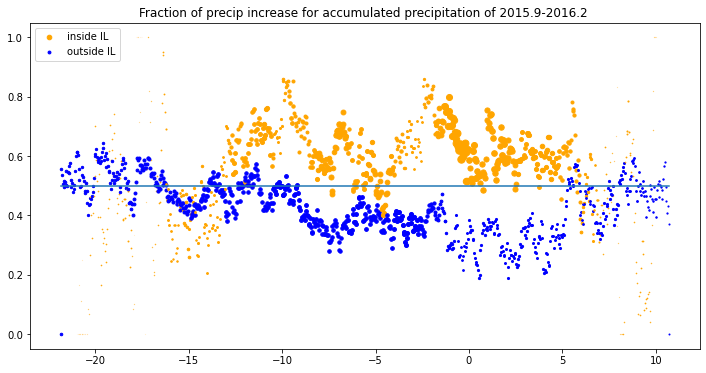

In [38]:
fig, axs = plt.subplots(1,1,figsize=(12,6))
for ii in range(size1.shape[0]):
    plt.scatter(lats[ii],frac1[ii],s=size1[ii]**2/25e2,color='orange')
    plt.scatter(lats[ii],frac2[ii],s=size2[ii]**2/400e2,color='blue')
plt.plot([lats[-1],lats[0]],[0.5,0.5])
ii=500
plt.scatter(lats[ii],frac1[ii],s=size1[ii]**2/25e2,color='orange',label='inside IL')
plt.scatter(lats[ii],frac2[ii],s=size2[ii]**2/400e2,color='blue',label='outside IL')
plt.legend()
plt.title('Fraction of precip increase for accumulated precipitation of 2015.9-2016.2 ')

### Change in zonal mean precipitation. 

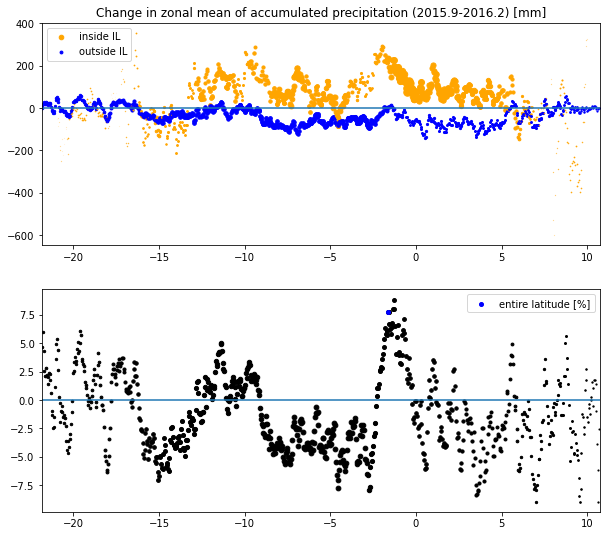

In [40]:
aa = dif_prec_IL.mean('west_east')
bb = dif_prec_out.mean('west_east')
cc = prec1.mean('west_east') - prec0.mean('west_east')
cc = cc/prec0.mean('west_east')*100

fig, axs = plt.subplots(2,1,figsize=(10,9))
for ii in range(size1.shape[0]):
    axs[0].scatter(lats[ii],aa[ii],s=size1[ii]**2/25e2,color='orange')
    axs[0].scatter(lats[ii],bb[ii],s=size2[ii]**2/400e2,color='blue')
    axs[1].scatter(lats[ii],cc[ii],s=size_all[ii]**2/400e2,color='black')

axs[0].set_title('Change in zonal mean of accumulated precipitation (2015.9-2016.2) [mm]')

ii=500
axs[0].scatter(lats[ii],aa[ii],s=size1[ii]**2/25e2,color='orange',label='inside IL')
axs[0].scatter(lats[ii],bb[ii],s=size2[ii]**2/400e2,color='blue',label='outside IL')
axs[1].scatter(lats[ii],cc[ii],s=size_all[ii]**2/400e2,color='blue',label='entire latitude [%]')

for ii in range(2):
    axs[ii].legend()
    axs[ii].plot([lats[0],lats[-1]],[0.,0.])
    #axs[ii].set_ylim([-1,1])
    axs[ii].set_xlim([lats[0],lats[-1]])

## Monthly area-averaged precipitation of [15S-5N] inside and outside of IL

### read data

In [42]:
dates=['2015-09-30','2015-10-31','2015-11-30','2015-12-31','2016-01-31','2016-02-28']
filename = 'energyflux_d01_'+dates[0]+'_00:00:00'
with xarray.open_dataset(path+'Amazon961x801_201509_201602/'+filename,decode_times=False,
                         mask_and_scale='True') as ds0:
    print('ok')
    data0 = ds0['RAINNC'][-1,:,:]

for ii in range(1,6):
    filename = 'energyflux_d01_'+dates[ii]+'_00:00:00'
    with xarray.open_dataset(path+'Amazon961x801_201509_201602/'+filename,decode_times=False,
                         mask_and_scale='True') as ds0:
        tmp=ds0['RAINNC'][-1,:,:]
    data0 = xarray.concat([data0,tmp],dim='month')

### ILgrassland
filename = 'energyflux_d01_'+dates[0]+'_00:00:00'
with xarray.open_dataset(path+'Amazon961x801_201509_201602_ILgrassland/'+filename,decode_times=False,
                         mask_and_scale='True') as ds1:
    print('ok')
    data1 = ds1['RAINNC'][-1,:,:]
for ii in range(1,6):
    filename = 'energyflux_d01_'+dates[ii]+'_00:00:00'
    with xarray.open_dataset(path+'Amazon961x801_201509_201602_ILgrassland/'+filename,decode_times=False,
                         mask_and_scale='True') as ds1:
        tmp=ds1['RAINNC'][-1,:,:]
    data1 = xarray.concat([data1,tmp],dim='month')

## Get the monthly mean precipitation
prec0_mon = xarray.concat([(data0[1:,:,:]-data0[0:-1,:,:])/30,data0[0,:,:]/30],dim='month',coords='different',join='right')
prec1_mon = xarray.concat([(data1[1:,:,:]-data1[0:-1,:,:])/30,data1[0,:,:]/30],dim='month',coords='different',join='right')
prec1_mon = prec1_mon.where(lu1<12,np.nan) # mask the ocean
prec0_mon = prec0_mon.where(lu1<12,np.nan) # mask the ocean

ok
ok


### Line plot of area-mean [15S-5N] change and fraction of precip increase

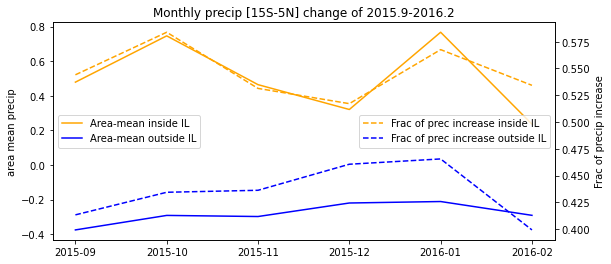

In [43]:
dif_lu = lu1 - lu0
dif_prec_mon = prec1_mon - prec0_mon
dif_prec_mon_IL = dif_prec_mon.where(dif_lu>0,np.nan)
dif_prec_mon_out = dif_prec_mon.where(dif_lu==0,np.nan)
dif_prec_mon_IL_areaave = dif_prec_mon_IL[:,200:700,:].mean(('south_north','west_east'))
dif_prec_mon_out_areaave = dif_prec_mon_out[:,200:700,:].mean(('south_north','west_east'))
frac_IL = np.sum(np.sum(dif_prec_mon_IL[:,200:700,:]>0,axis=2),axis=1)/np.sum(np.sum(np.isnan(dif_prec_mon_IL[0,200:700,:].values)==0,axis=1))
frac_out = np.sum(np.sum(dif_prec_mon_out[:,200:700,:]>0,axis=2),axis=1)/np.sum(np.sum(np.isnan(dif_prec_mon_out[0,200:700,:].values)==0,axis=1))

fig, ax1 = plt.subplots(figsize=(9, 4))
# Instantiate a second axes that shares the same x-axis
ax2 = ax1.twinx()  
ax1.plot(range(6),dif_prec_mon_IL_areaave[:],'orange',label='Area-mean inside IL')
ax1.plot(range(6),dif_prec_mon_out_areaave[:],'blue',label='Area-mean outside IL')
ax2.plot(range(6),frac_IL[:],'orange',linestyle='dashed',label='Frac of prec increase inside IL')
ax2.plot(range(6),frac_out[:],'blue',linestyle='dashed',label='Frac of prec increase outside IL')
ax1.set_ylabel('area mean precip')
ax2.set_ylabel('Frac of precip increase')
ax1.set_xticks(range(6))
ax1.set_xticklabels(['2015-09','2015-10','2015-11','2015-12','2016-01','2016-02'])

plt.title('Monthly precip [15S-5N] change of 2015.9-2016.2')
ax2.legend()
ax1.legend()

### Monthly precip change at each latitude

#### zonal mean precipitation change

<ipython-input-44-60581bc0b880>:7: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im=axes[0].pcolormesh(range(6),lats,np.transpose(dif_prec_mon_IL_areaave.values),cmap='BrBG',vmin=-2,vmax=2)
<ipython-input-44-60581bc0b880>:8: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im=axes[1].pcolormesh(range(6),lats,np.transpose(dif_prec_mon_out_areaave.values),cmap='BrBG',vmin=-2,vmax=2)
<ipython-input-44-60581bc0b880>:9: MatplotlibDeprecationWarning: shading='flat' w

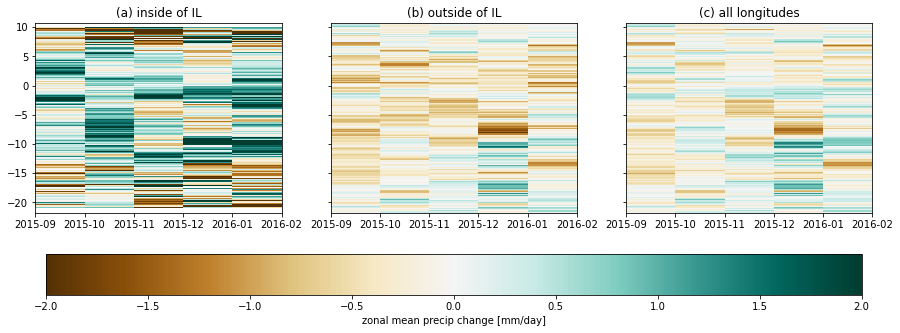

In [44]:
dif_prec_mon_IL_areaave = dif_prec_mon_IL[:,:,:].mean(('west_east'))
dif_prec_mon_out_areaave = dif_prec_mon_out[:,:,:].mean(('west_east'))
dif_prec_mon_areaave = dif_prec_mon[:,:,:].mean(('west_east'))

fig,axes = plt.subplots(1,3,figsize=(15,5),sharex=True,sharey=True)
axes = axes.ravel()  
im=axes[0].pcolormesh(range(6),lats,np.transpose(dif_prec_mon_IL_areaave.values),cmap='BrBG',vmin=-2,vmax=2)
im=axes[1].pcolormesh(range(6),lats,np.transpose(dif_prec_mon_out_areaave.values),cmap='BrBG',vmin=-2,vmax=2)
im=axes[2].pcolormesh(range(6),lats,np.transpose(dif_prec_mon_areaave.values),cmap='BrBG',vmin=-2,vmax=2)

fig.colorbar(im,ax=axes,orientation='horizontal',label='zonal mean precip change [mm/day]')
axes[0].set_title('(a) inside of IL')
axes[1].set_title('(b) outside of IL')
axes[2].set_title('(c) all longitudes')

for ii in range(2):
    axes[ii].set_xticks(range(6))
    axes[ii].set_xticklabels(['2015-09','2015-10','2015-11','2015-12','2016-01','2016-02'])

#### Fraction of precipitation increase

<ipython-input-88-1db399d1692d>:8: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im=axes[0].pcolormesh(range(7),lats,np.transpose(frac_IL.values),cmap='viridis',vmin=0.2,vmax=0.6)
<ipython-input-88-1db399d1692d>:9: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im=axes[1].pcolormesh(range(7),lats,np.transpose(frac_out.values),cmap='viridis',vmin=0.2,vmax=0.6)


Text(0.5, 0.98, 'fraction of precip increase')

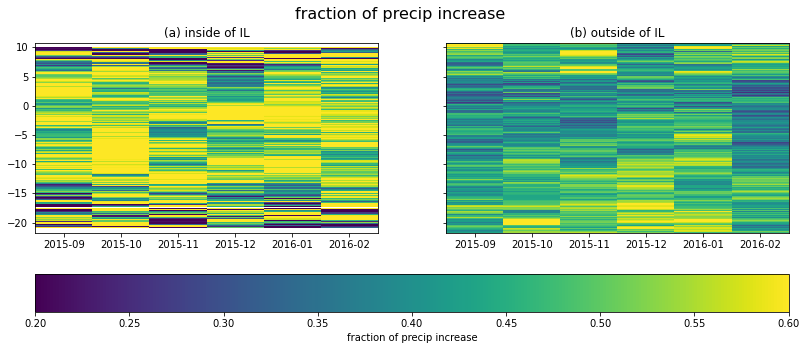

In [88]:
dif_prec_mon_IL_areaave = dif_prec_mon_IL[:,:,:].mean(('west_east'))
dif_prec_mon_out_areaave = dif_prec_mon_out[:,:,:].mean(('west_east'))
frac_IL = np.sum(dif_prec_mon_IL>0,axis=2)/np.sum(np.isnan(dif_prec_mon_IL.values)==0,axis=2)
frac_out = np.sum(dif_prec_mon_out>0,axis=2)/np.sum(np.isnan(dif_prec_mon_out.values)==0,axis=2)

fig,axes = plt.subplots(1,2,figsize=(13.5,5),sharex=True,sharey=True)
axes = axes.ravel()  
im=axes[0].pcolormesh(range(7),lats,np.transpose(frac_IL.values),cmap='viridis',vmin=0.2,vmax=0.6)
im=axes[1].pcolormesh(range(7),lats,np.transpose(frac_out.values),cmap='viridis',vmin=0.2,vmax=0.6)
fig.colorbar(im,ax=axes,orientation='horizontal',label='fraction of precip increase')
axes[0].set_title('(a) inside of IL')
axes[1].set_title('(b) outside of IL')
for ii in range(2):
    axes[ii].set_xticks(np.linspace(0.5,5.5,6))
    axes[ii].set_xticklabels(['2015-09','2015-10','2015-11','2015-12','2016-01','2016-02'])
plt.suptitle('fraction of precip increase',fontsize=16)

### Fraction of prec increase Inside IL for the four quadrants (y_mid = 300; x_mid = 400)


In [85]:
## frac of prec increase Inside IL for the four quadrants (x_mid = 300; y_mid = 539)
dif_prec1=dif_prec_mon_IL[:,539:800,300:960]
dif_prec2=dif_prec_mon_IL[:,539:800,0:300]
dif_prec3=dif_prec_mon_IL[:,0:539,0:300]
dif_prec4=dif_prec_mon_IL[:,0:539,300:960]
frac1 = np.sum(np.sum(dif_prec1>0,axis=2),axis=1)/np.sum(np.sum(np.isnan(dif_prec1.values)==0,axis=2),axis=1)
frac2 = np.sum(np.sum(dif_prec2>0,axis=2),axis=1)/np.sum(np.sum(np.isnan(dif_prec2.values)==0,axis=2),axis=1)
frac3 = np.sum(np.sum(dif_prec3>0,axis=2),axis=1)/np.sum(np.sum(np.isnan(dif_prec3.values)==0,axis=2),axis=1)
frac4 = np.sum(np.sum(dif_prec4>0,axis=2),axis=1)/np.sum(np.sum(np.isnan(dif_prec4.values)==0,axis=2),axis=1)
frac_IL = np.zeros((4,6))
frac_IL[0,:] = frac1
frac_IL[1,:] = frac2
frac_IL[2,:] = frac3
frac_IL[3,:] = frac4

In [86]:
## frac of prec increase outside of IL
dif_prec1=dif_prec_mon_out[:,539:800,300:960]
dif_prec2=dif_prec_mon_out[:,539:800,0:300]
dif_prec3=dif_prec_mon_out[:,0:539,0:300]
dif_prec4=dif_prec_mon_out[:,0:539,300:960]
frac1 = np.sum(np.sum(dif_prec1>0,axis=2),axis=1)/np.sum(np.sum(np.isnan(dif_prec1.values)==0,axis=2),axis=1)
frac2 = np.sum(np.sum(dif_prec2>0,axis=2),axis=1)/np.sum(np.sum(np.isnan(dif_prec2.values)==0,axis=2),axis=1)
frac3 = np.sum(np.sum(dif_prec3>0,axis=2),axis=1)/np.sum(np.sum(np.isnan(dif_prec3.values)==0,axis=2),axis=1)
frac4 = np.sum(np.sum(dif_prec4>0,axis=2),axis=1)/np.sum(np.sum(np.isnan(dif_prec4.values)==0,axis=2),axis=1)
frac_out = np.zeros((4,6))
frac_out[0,:] = frac1
frac_out[1,:] = frac2
frac_out[2,:] = frac3
frac_out[3,:] = frac4

Text(0.5, 0.98, 'fraction of precip increase [%]')

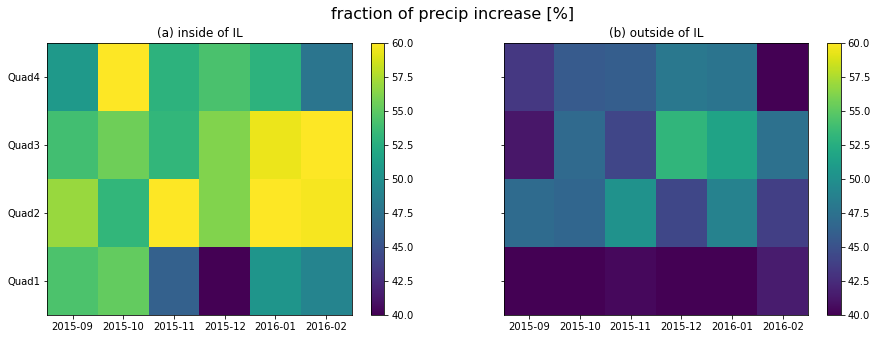

In [87]:
fig,axes = plt.subplots(1,2,figsize=(15,5),sharex=True,sharey=True)
axes = axes.ravel() 
im0=axes[0].pcolormesh(range(7),range(5),frac_IL*100,vmin=40,vmax=60,cmap='viridis')
fig.colorbar(im0,ax=axes[0])
im1=axes[1].pcolormesh(range(7),range(5),frac_out*100,vmin=40,vmax=60,cmap='viridis')
fig.colorbar(im1,ax=axes[1])
axes[0].set_title('(a) inside of IL')
axes[1].set_title('(b) outside of IL')
for ii in range(2):
    axes[ii].set_xticks(np.linspace(0.5,5.5,6))
    axes[ii].set_xticklabels(['2015-09','2015-10','2015-11','2015-12','2016-01','2016-02'])
    axes[ii].set_yticks(np.linspace(0.5,3.5,4))
    axes[ii].set_yticklabels(['Quad1','Quad2','Quad3','Quad4'])
plt.suptitle('fraction of precip increase [%]',fontsize=16)

Text(0.5, 0.98, 'Zonal mean precip change [mm/day]')

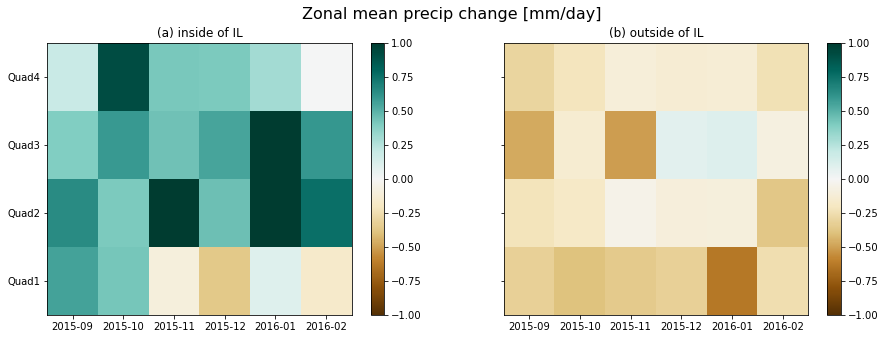

In [83]:
## frac of prec increase Inside IL for the four quadrants (x_mid = 300; y_mid = 400)
dif_prec1=dif_prec_mon_IL[:,539:800,300:960]
dif_prec2=dif_prec_mon_IL[:,539:800,0:300]
dif_prec3=dif_prec_mon_IL[:,0:539,0:300]
dif_prec4=dif_prec_mon_IL[:,0:539,300:960]
frac_IL = np.zeros((4,6))
frac_IL[0,:] = dif_prec1.mean(('south_north','west_east'))
frac_IL[1,:] = dif_prec2.mean(('south_north','west_east'))
frac_IL[2,:] = dif_prec3.mean(('south_north','west_east'))
frac_IL[3,:] = dif_prec4.mean(('south_north','west_east'))

## frac of prec increase outside of IL
dif_prec1=dif_prec_mon_out[:,539:800,300:960]
dif_prec2=dif_prec_mon_out[:,539:800,0:300]
dif_prec3=dif_prec_mon_out[:,0:539,0:300]
dif_prec4=dif_prec_mon_out[:,0:539,300:960]

frac_out = np.zeros((4,6))
frac_out[0,:] = dif_prec1.mean(('south_north','west_east'))
frac_out[1,:] = dif_prec2.mean(('south_north','west_east'))
frac_out[2,:] = dif_prec3.mean(('south_north','west_east'))
frac_out[3,:] = dif_prec4.mean(('south_north','west_east'))

fig,axes = plt.subplots(1,2,figsize=(15,5),sharex=True,sharey=True)
axes = axes.ravel() 
im0=axes[0].pcolormesh(range(7),range(5),frac_IL,vmin=-1,vmax=1,cmap='BrBG')
fig.colorbar(im0,ax=axes[0])
im1=axes[1].pcolormesh(range(7),range(5),frac_out,vmin=-1,vmax=1,cmap='BrBG')
fig.colorbar(im1,ax=axes[1])
axes[0].set_title('(a) inside of IL')
axes[1].set_title('(b) outside of IL')
for ii in range(2):
    axes[ii].set_xticks(np.linspace(0.5,5.5,6))
    axes[ii].set_xticklabels(['2015-09','2015-10','2015-11','2015-12','2016-01','2016-02'])
    axes[ii].set_yticks(np.linspace(0.5,3.5,4))
    axes[ii].set_yticklabels(['Quad1','Quad2','Quad3','Quad4'])
plt.suptitle('Zonal mean precip change [mm/day]',fontsize=16)

## Load the precipitation data (accumulated gridscale rainfall in hourly resolution)

In [17]:
import xarray
path = '/ocean/projects/ees210014p/xjliu/Amazon_exp/'
with xarray.open_dataset(path+'post_processing/Amazon961x801/precip.ctrl.201509_201602.nc',decode_times=False,
                         mask_and_scale='True') as ds0:
    print('ok')
#prec0 = ds0['RAINNC'][1:,:,:] - ds0['RAINNC'][0:-1,:,:]

with xarray.open_dataset(path+'post_processing/Amazon961x801/precip.ILgrassland.201509_201602.nc',decode_times=False,
                         mask_and_scale='True') as ds1:
    print('ok')
#prec1 = ds1['RAINNC'][1:,:,:] - ds1['RAINNC'][0:-1,:,:]
prec1_day = ds1['RAINNC'][23::24,:,:]
prec0_day = ds0['RAINNC'][23::24,:,:]

ok
ok


## Check the daily mean and monthly mean precipitation

In [ ]:
# change precipitaiton to mm/day
import copy
#prec0_day = np.zeros(prec0[:180,:,:].shape)
#prec1_day = np.zeros(prec0[:180,:,:].shape)

#for ii in range(180):
#    prec0_day[ii,:,:] = prec0[ii*24:(ii+1)*24,:,:].sum(axis=0)
#    prec1_day[ii,:,:] = prec1[ii*24:(ii+1)*24,:,:].sum(axis=0)

prec0_mon = np.zeros(prec0[:6,:,:].shape)
prec1_mon = np.zeros(prec0[:6,:,:].shape)
for ii in range(6):
    prec0_mon[ii,:,:] = prec0_day[ii*30:(ii+1)*30,:,:].mean(axis=0)
    prec1_mon[ii,:,:] = prec1_day[ii*30:(ii+1)*30,:,:].mean(axis=0)

<ipython-input-16-b0f0abc70910>:5: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axes[ii].pcolormesh(lons,lats,prec0_day[ii*30,:,:],


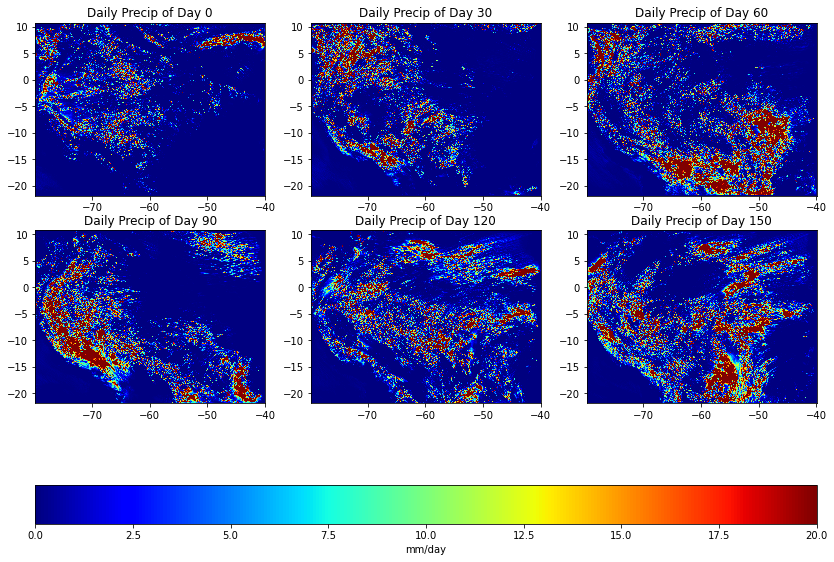

In [ ]:
fig, axes = plt.subplots(2,3,figsize=(14,10))
axes = axes.ravel()
months = ['Sept','Oct','Nov','Dec','Jan','Feb']
for ii in range(6):
    im = axes[ii].pcolormesh(lons,lats,prec0_day[ii*30,:,:],
                       vmin=0,vmax=20,cmap='jet')
    axes[ii].set_title('Daily Precip of Day '+str(ii*30))

fig.colorbar(im, ax=axes,label='mm/day',orientation='horizontal')


<ipython-input-17-83a0b4ac78bd>:5: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axes[ii].pcolormesh(lons,lats,prec0_day[ii*30:ii*30+30,:,:].mean(axis=0),


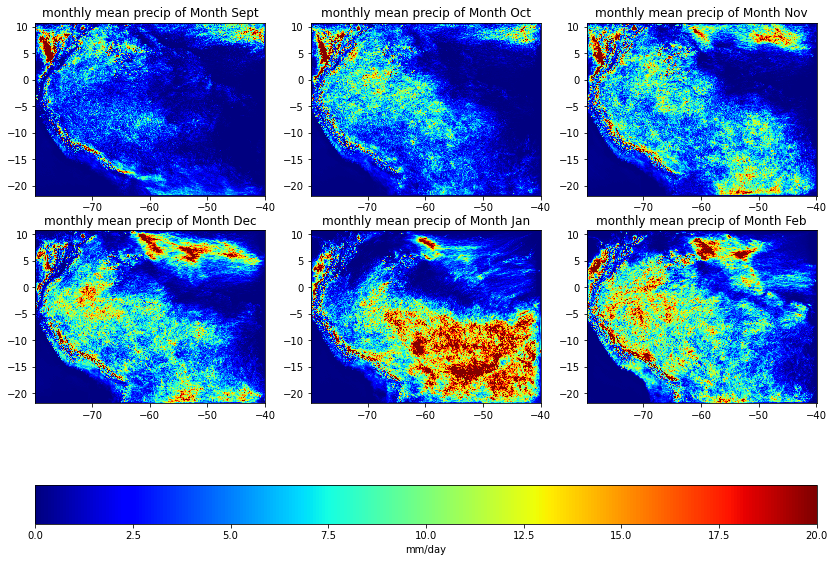

In [ ]:
fig, axes = plt.subplots(2,3,figsize=(14,10))
axes = axes.ravel()
months = ['Sept','Oct','Nov','Dec','Jan','Feb']
for ii in range(6):
    im = axes[ii].pcolormesh(lons,lats,prec0_day[ii*30:ii*30+30,:,:].mean(axis=0),
                       vmin=0,vmax=20,cmap='jet')
    axes[ii].set_title('monthly mean precip of Month '+months[ii])

fig.colorbar(im, ax=axes,label='mm/day',orientation='horizontal')

## Change in monthly mean precipitation

<ipython-input-18-ebd1a4cdabe7>:5: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axes[3*ii].pcolormesh(lons,lats,prec0_mon[ii,:,:],
<ipython-input-18-ebd1a4cdabe7>:7: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axes[3*ii+1].pcolormesh(lons,lats,prec1_mon[ii,:,:],
<ipython-input-18-ebd1a4cdabe7>:9: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the qua

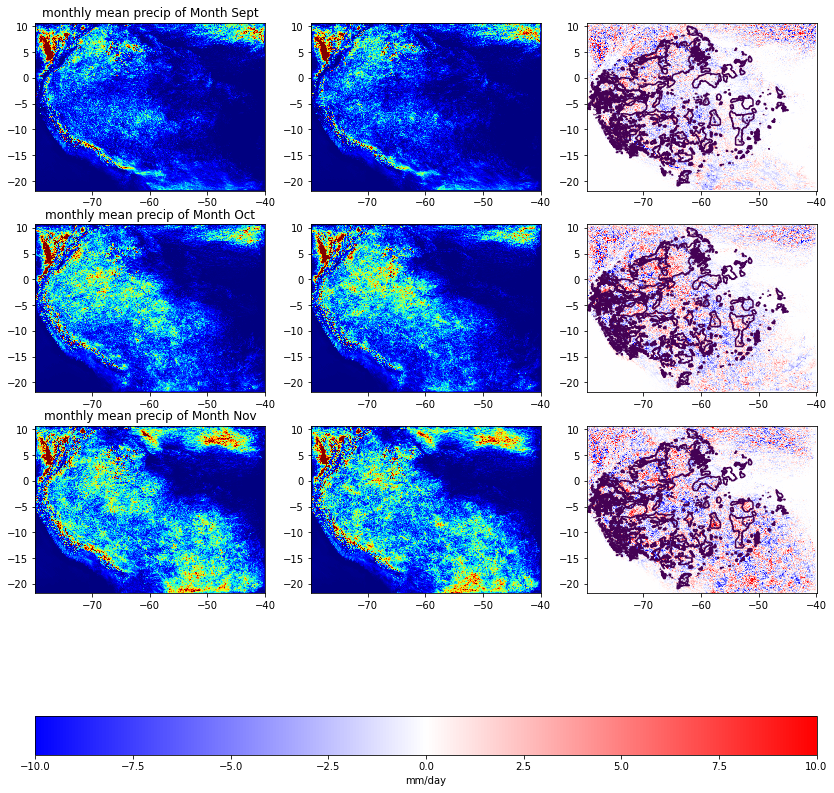

In [ ]:
fig, axes = plt.subplots(3,3,figsize=(14,15))
axes = axes.ravel()
months = ['Sept','Oct','Nov','Dec','Jan','Feb']
for ii in range(3):
    im = axes[3*ii].pcolormesh(lons,lats,prec0_mon[ii,:,:],
                       vmin=0,vmax=20,cmap='jet')
    im = axes[3*ii+1].pcolormesh(lons,lats,prec1_mon[ii,:,:],
                       vmin=0,vmax=20,cmap='jet')
    im = axes[3*ii+2].pcolormesh(lons,lats,prec1_mon[ii,:,:] - prec0_mon[ii,:,:],
                       vmin=-10,vmax=10,cmap='bwr')
    axes[3*ii+2].contour(lons,lats,lu1-lu0,levels=[1])
    axes[3*ii].set_title('monthly mean precip of Month '+months[ii])

fig.colorbar(im, ax=axes,label='mm/day',orientation='horizontal')

## Calculation of MCWD
### accumulation of precip - ET (set it to be constant here 3.3 mm/day) greater than 0

In [18]:
cwd0 = np.zeros(prec0_day.shape)
cwd1 = np.zeros(prec0_day.shape)

#prec0_day[]
for ii in range(1,180):
    cwd0[ii,:,:] = cwd0[ii-1,:,:] + prec0_day[ii,:,:] - 3
    cwd0[ii,:,:]= np.where(cwd0[ii,:,:]>0,0,cwd0[ii,:,:])   
    
    cwd1[ii,:,:] = cwd1[ii-1,:,:] + prec1_day[ii,:,:] - 3
    cwd1[ii,:,:]= np.where(cwd1[ii,:,:]>0,0,cwd1[ii,:,:])   

IndexError: index 7 is out of bounds for axis 0 with size 7

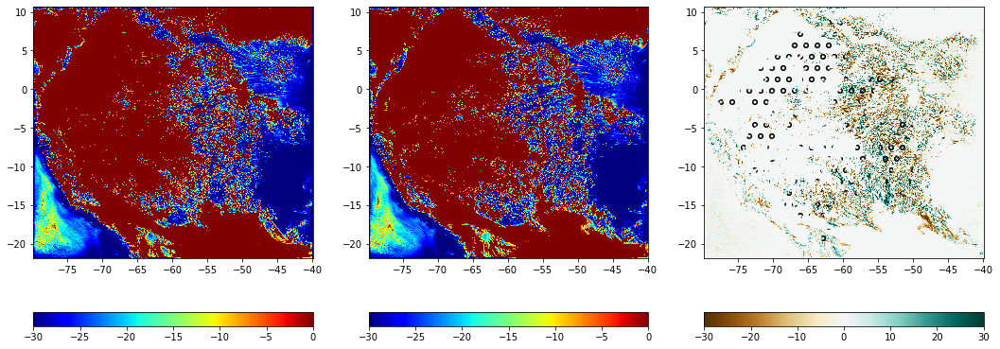

In [16]:
fig, axes = plt.subplots(1,3,figsize=(18,7))
axes = axes.ravel()

TIME=10
im0 = axes[0].pcolormesh(lons,lats,cwd0[TIME,:,:],cmap='jet')
im1 = axes[1].pcolormesh(lons,lats,cwd1[TIME,:,:],cmap='jet')
im2=axes[2].pcolormesh(lons,lats,cwd1[TIME,:,:]-cwd0[TIME,:,:],cmap='BrBG')
axes[2].contourf(lons,lats,IL_sel,hatches='o',alpha=0.0)
fig.colorbar(im0,ax=axes[0],orientation='horizontal')
fig.colorbar(im1,ax=axes[1],orientation='horizontal')
fig.colorbar(im2,ax=axes[2],orientation='horizontal')

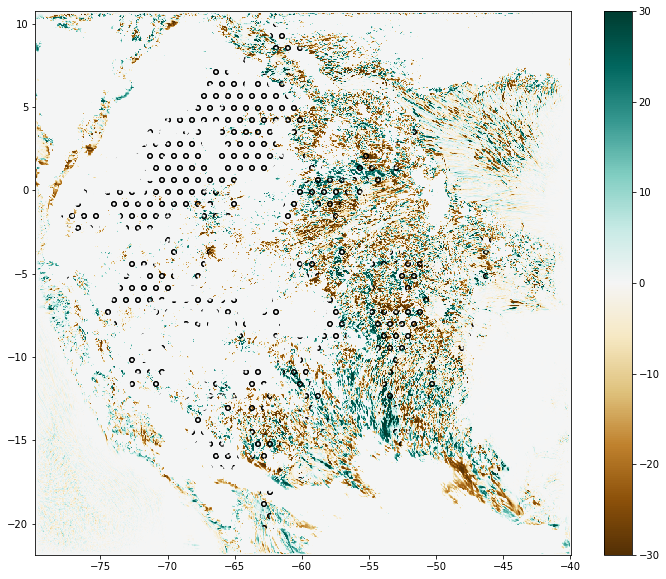

In [21]:
plt.figure(figsize=(12,10))
plt.pcolormesh(lons,lats,cwd1[TIME,:,:]-cwd0[TIME,:,:],cmap='BrBG')
plt.colorbar()
plt.contourf(lons,lats,IL_sel,hatches='o',alpha=0.0)


In [ ]:
path = '/ocean/projects/ees210014p/xjliu/Amazon_exp/'
with xarray.open_dataset(path+'post_processing/Amazon561x721/energy.2015.01.UTC15.mean.ctrl.nc',decode_times=False,
                         mask_and_scale='True') as ds0:
    print('ok')

with xarray.open_dataset(path+'post_processing/Amazon561x721/energy.2015.01.UTC15.mean.ILgrassland.nc',decode_times=False,
                         mask_and_scale='True') as ds1:
    print('ok')

fig,axes = plt.subplots(2,2,figsize=(12,10),sharex=True,sharey=True)
axes = axes.ravel()  
varname = ['LH','HFX','TSK','ALBEDO']

vmins=[-200,-50,-5,-0.1]
vmaxs=[200,50,5,0.1]
cmaps=['PiYG','PiYG','bwr','coolwarm','bwr','PiYG']
units=['W/m^2','W/m^2','K','1']

for ii in range(4):
    img = axes[ii].pcolormesh(lons,lats,ds1[varname[ii]][0,:,:]-ds0[varname[ii]][0,:,:],cmap='bwr',
                            vmin=vmins[ii],vmax=vmaxs[ii])
    fig.colorbar(img,ax=axes[ii],orientation='vertical',label='units: '+units[ii])
    axes[ii].set_title(varname[ii])
    axes[ii].contour(lons,lats,lu1-lu0,levels=[1])


# Energy budget at the surface

## 1. change in ground flux (net radiation - LH - SH) is not small

<ipython-input-13-697766716c61>:14: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axes[0].pcolormesh(lons,lats,Rad1[0,:,:],cmap='jet',vmin=0,vmax=1000)
<ipython-input-13-697766716c61>:17: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axes[1].pcolormesh(lons,lats,Rnet1[0,:,:],cmap='jet',vmin=0,vmax=1000)
<ipython-input-13-697766716c61>:20: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3

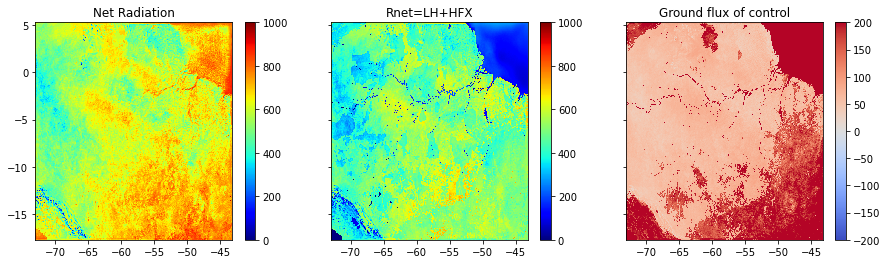

In [13]:
Rad0 = ds0['SWDNB']-ds0['SWUPB']+ds0['LWDNB']-ds0['LWUPB']
Rad1 = ds1['SWDNB']-ds1['SWUPB']+ds1['LWDNB']-ds1['LWUPB']
Rnet0 = ds0['HFX']+ds0['LH']
Rnet1 = ds1['HFX']+ds1['LH']

Rsoil0 = Rad0 - Rnet0
Rsoil1 = Rad1 - Rnet1

var='SWUPB'

fig,axes = plt.subplots(1,3,figsize=(15,4),sharex=True,sharey=True)
axes = axes.ravel()  

im = axes[0].pcolormesh(lons,lats,Rad1[0,:,:],cmap='jet',vmin=0,vmax=1000)
fig.colorbar(im,ax=axes[0])

im = axes[1].pcolormesh(lons,lats,Rnet1[0,:,:],cmap='jet',vmin=0,vmax=1000)
fig.colorbar(im,ax=axes[1])

im = axes[2].pcolormesh(lons,lats,Rad0[0,:,:]-Rnet0[0,:,:],cmap='coolwarm',vmin=-200,vmax=200)
fig.colorbar(im,ax=axes[2])

titles=['Net Radiation','Rnet=LH+HFX','Ground flux of control']
for ii in range(3):
    axes[ii].set_title(titles[ii])

## 2. Change in energy at the surface

<ipython-input-14-f162ddf55039>:4: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axes[0].pcolormesh(lons,lats,Rad1[0,:,:]-Rad0[0,:,:],cmap='bwr',vmin=-200,vmax=200)
<ipython-input-14-f162ddf55039>:7: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axes[1].pcolormesh(lons,lats,Rnet1[0,:,:]-Rnet0[0,:,:],cmap='bwr',vmin=-200,vmax=200)
<ipython-input-14-f162ddf55039>:10: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions a

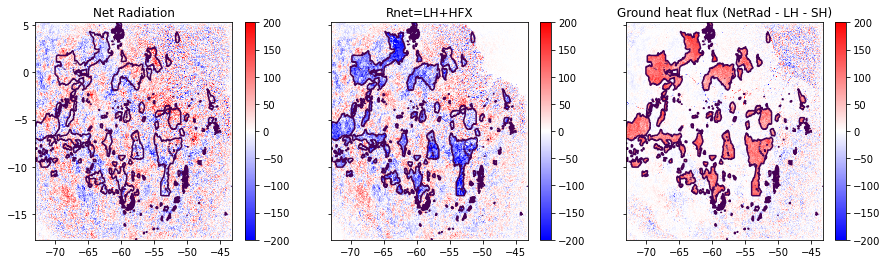

In [14]:
fig,axes = plt.subplots(1,3,figsize=(15,4),sharex=True,sharey=True)
axes = axes.ravel()  

im = axes[0].pcolormesh(lons,lats,Rad1[0,:,:]-Rad0[0,:,:],cmap='bwr',vmin=-200,vmax=200)
fig.colorbar(im,ax=axes[0])

im = axes[1].pcolormesh(lons,lats,Rnet1[0,:,:]-Rnet0[0,:,:],cmap='bwr',vmin=-200,vmax=200)
fig.colorbar(im,ax=axes[1])

im = axes[2].pcolormesh(lons,lats,Rsoil1[0,:,:]-Rsoil0[0,:,:],cmap='bwr',vmin=-200,vmax=200)
fig.colorbar(im,ax=axes[2])

titles=['Net Radiation','Rnet=LH+HFX','Ground heat flux (NetRad - LH - SH)']
for ii in range(3):
    axes[ii].set_title(titles[ii])
    axes[ii].contour(lons,lats,lu1-lu0,levels=[1])

## 3. Change in each energy term at the surface

<ipython-input-15-9db777f47c5b>:10: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axes[ii].pcolormesh(lons,lats,ds1[varxs[ii]][0,:,:] - ds0[varxs[ii]][0,:,:],
<ipython-input-15-9db777f47c5b>:10: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  im = axes[ii].pcolormesh(lons,lats,ds1[varxs[ii]][0,:,:] - ds0[varxs[ii]][0,:,:],
<ipython-input-15-9db777f47c5b>:10: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is depreca

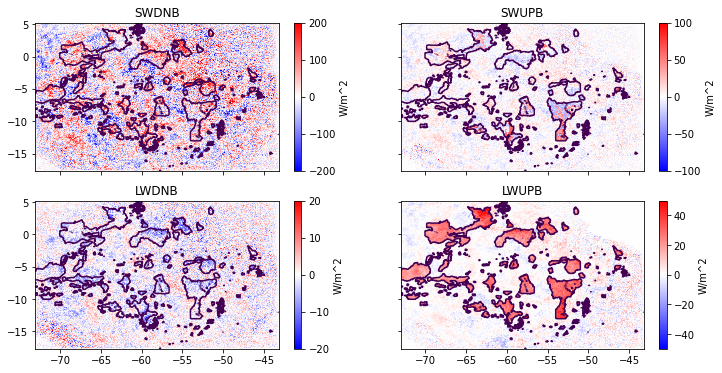

In [15]:
varxs=['SWDNB','SWUPB','LWDNB','LWUPB']#'SWUPT','LWUPT','LWDNB','LWUPB','LWDNT',

fig,axes = plt.subplots(2,2,figsize=(12,6),sharex=True,sharey=True)
axes = axes.ravel()  

vmins = [-200,-100,-20,-50]
vmaxs = [200,100,20,50]

for ii in range(4):
    im = axes[ii].pcolormesh(lons,lats,ds1[varxs[ii]][0,:,:] - ds0[varxs[ii]][0,:,:],
                             cmap='bwr',vmin=vmins[ii],vmax=vmaxs[ii])
    axes[ii].contour(lons,lats,lu1-lu0,levels=[1])
    axes[ii].set_title(varxs[ii])
    fig.colorbar(im,ax=axes[ii],orientation='vertical',label='W/m^2')


## Plot the winds

<ipython-input-22-6e6bd5d53a48>:7: UserWarning: The following kwargs were not used by contour: 'scale_units'
  plt.contour(lons,lats,lu1-lu0,levels=[1],scale_units='inches')


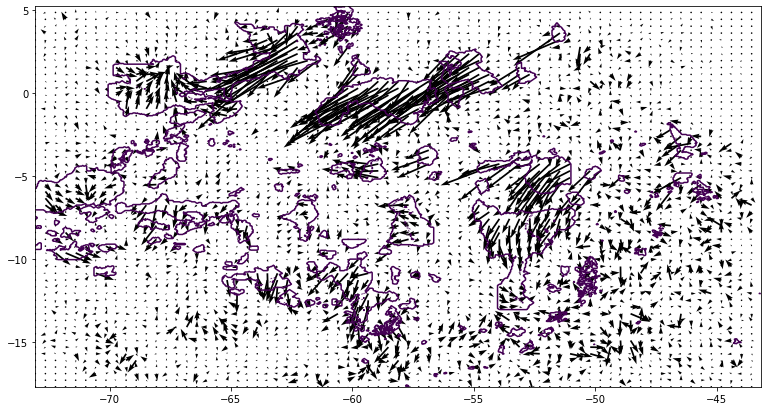

In [22]:
plt.figure(figsize=(13,7))
u10 = ds1['U10']-ds0['U10']
v10 = ds1['V10']-ds0['V10']
plt.quiver(lons[::10], lats[::10],
           u10[0,::10, ::10], v10[0,::10, ::10],
           cmap='jet')
plt.contour(lons,lats,lu1-lu0,levels=[1],scale_units='inches')


## 4. Relate 3 to clouds, surface temperature, and surface humidity etc. 

## Soil moisture

In [9]:
with xarray.open_dataset(path+'SMOIS.201409_201412.ILave.ctrl.nc',decode_times=False,
                         mask_and_scale='True') as ds0:
    print('ok')
    
with xarray.open_dataset(path+'SMOIS.201409_201412.ILave.ILgrassland.nc',decode_times=False,
                         mask_and_scale='True') as ds1:
    print('ok')
    
smois0_areaave = ds0['SMOIS']
smois1_areaave = ds1['SMOIS']

ok
ok


Text(0, 0.5, 'Soil Moisture [m3/m3]')

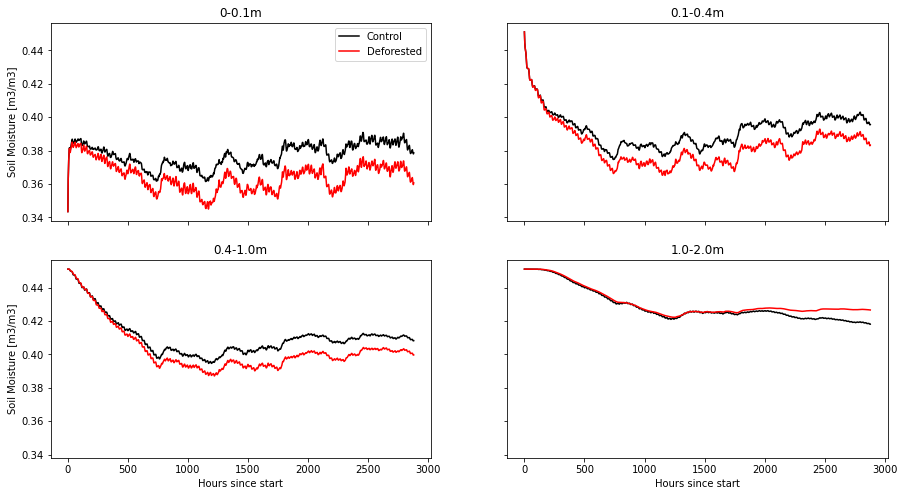

In [11]:
fig,axes = plt.subplots(2,2,figsize=(15,8),sharex=True,sharey=True)
axes = axes.ravel()  
titles=['0-0.1m','0.1-0.4m','0.4-1.0m','1.0-2.0m']
for ii in range(4):
    axes[ii].plot(smois0_areaave[:,ii],'k',label='Control')
    axes[ii].plot(smois1_areaave[:,ii],'r',label='Deforested')
    axes[ii].set_title(titles[ii])
axes[0].legend()
axes[2].set_xlabel('Hours since start')
axes[3].set_xlabel('Hours since start')
axes[0].set_ylabel('Soil Moisture [m3/m3]')
axes[2].set_ylabel('Soil Moisture [m3/m3]')

### Soil moisture

ok


<ipython-input-83-b578299b01ef>:13: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  img = axes[ii].pcolormesh(lons,lats,ds1['SMOIS'][600+ii*5,0,:,:],cmap='coolwarm',vmin=-0.1,vmax=0.1


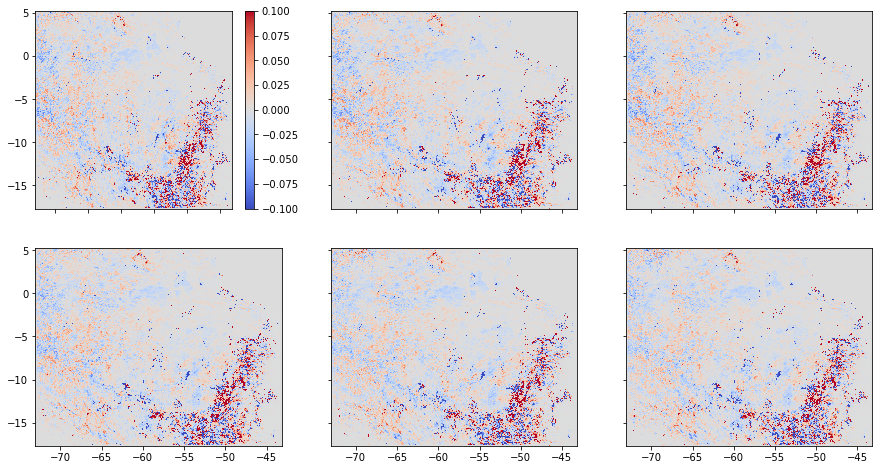

In [83]:
path = '/ocean/projects/ees210014p/xjliu/Amazon_exp/'

with xarray.open_dataset(path+'Amazon_NoahMP_dveg9_201407_ILgrassland/dif_LAND.nc',decode_times=False,
                         mask_and_scale='True') as ds1:
    print('ok')
    
fig,axes = plt.subplots(2,3,figsize=(15,8),sharex=True,sharey=True)
axes = axes.ravel()  
varname = ['SMOIS']


for ii in range(6):
    img = axes[ii].pcolormesh(lons,lats,ds1['SMOIS'][600+ii*5,0,:,:],cmap='coolwarm',vmin=-0.1,vmax=0.1
                         )
fig.colorbar(img,ax=axes[0])
#axes[ii].contour(lons,lats,lu1,levels=[5])

In [ ]:
### TSK for both noon and night
fig,axes = plt.subplots(1,2,figsize=(14,4),sharex=True,sharey=True)
axes = axes.ravel()  
img = axes[0].contourf(lons,lats,ds0['TSK'].mean('Time')-273.15,cmap='rainbow',
                             levels=np.arange(20,51,1),extend='both')
fig.colorbar(img,ax=axes[0])
axes[0].set_title('TSK at local noon')
### local night
img = axes[1].contourf(lons,lats,ds1['TSK'].mean('Time')-273.15,cmap='rainbow',
                             levels=np.arange(20,31,1),extend='both')
fig.colorbar(img,ax=axes[1])
axes[ii].set_title('TSK at local night')

ok


Text(0.5, 1.0, 'TSK at local night')

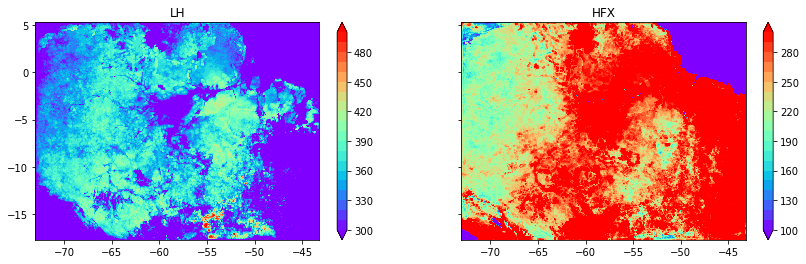

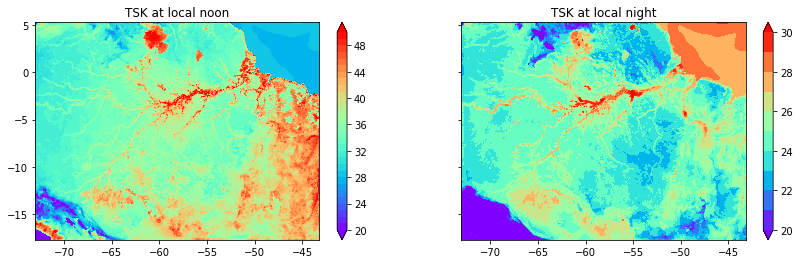

In [17]:
### Default NOAH_MP
with xarray.open_dataset(path+'post_processing/Amazon561x721/energy.2015.obs.NoahMP.multidaymean.nc',decode_times=False,
                         mask_and_scale='True') as ds0:
    print('ok')
    
fig,axes = plt.subplots(1,2,figsize=(14,4),sharex=True,sharey=True)
axes = axes.ravel()  
varname = ['LH','HFX','TSK','ALBEDO']
levs=[np.arange(300,501,10),np.arange(100,301,10),np.arange(20,51,1)]

for ii in range(2):
    img = axes[ii].contourf(lons,lats,ds0[varname[ii]][15,:,:],cmap='rainbow',
                             levels=levs[ii],extend='both')
    fig.colorbar(img,ax=axes[ii])
    axes[ii].set_title(varname[ii])
    #axes[ii].contour(lons,lats,lu1,levels=[5])

### TSK for both noon and night
fig,axes = plt.subplots(1,2,figsize=(14,4),sharex=True,sharey=True)
axes = axes.ravel()  
img = axes[0].contourf(lons,lats,ds0['TSK'][15,:,:]-273.15,cmap='rainbow',
                             levels=np.arange(20,51,1),extend='both')
fig.colorbar(img,ax=axes[0])
axes[0].set_title('TSK at local noon')
### local night
img = axes[1].contourf(lons,lats,ds0['TSK'][5,:,:]-273.15,cmap='rainbow',
                             levels=np.arange(20,31,1),extend='both')
fig.colorbar(img,ax=axes[1])
axes[ii].set_title('TSK at local night')    

ok


Text(0.5, 1.0, 'TSK at local night')

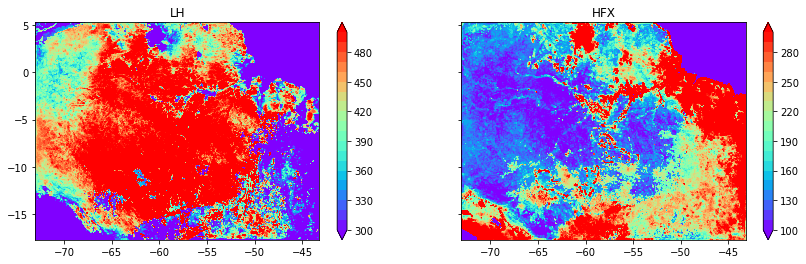

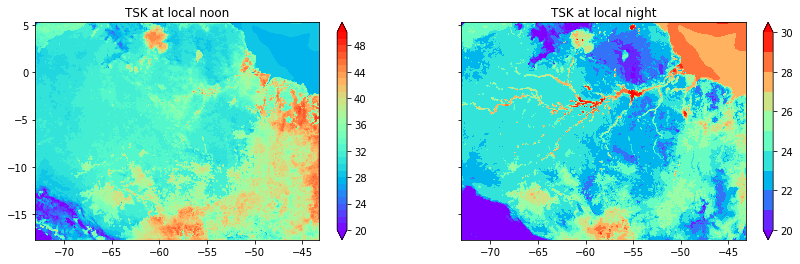

In [18]:
#### CLM4 
with xarray.open_dataset(path+'post_processing/Amazon561x721/energy.201511.obs.nc',decode_times=False,
                         mask_and_scale='True') as ds0:
    print('ok')
    
fig,axes = plt.subplots(1,2,figsize=(14,4),sharex=True,sharey=True)
axes = axes.ravel()  
varname = ['LH','HFX','TSK','ALBEDO']
levs=[np.arange(300,501,10),np.arange(100,301,10),np.arange(20,51,1)]

for ii in range(2):
    img = axes[ii].contourf(lons,lats,ds0[varname[ii]][15,:,:],cmap='rainbow',
                             levels=levs[ii],extend='both')
    fig.colorbar(img,ax=axes[ii])
    axes[ii].set_title(varname[ii])
    #axes[ii].contour(lons,lats,lu1,levels=[5])

### TSK for both noon and night
fig,axes = plt.subplots(1,2,figsize=(14,4),sharex=True,sharey=True)
axes = axes.ravel()  
img = axes[0].contourf(lons,lats,ds0['TSK'][15,:,:]-273.15,cmap='rainbow',
                             levels=np.arange(20,51,1),extend='both')
fig.colorbar(img,ax=axes[0])
axes[0].set_title('TSK at local noon')
### local night
img = axes[1].contourf(lons,lats,ds0['TSK'][5,:,:]-273.15,cmap='rainbow',
                             levels=np.arange(20,31,1),extend='both')
fig.colorbar(img,ax=axes[1])
axes[ii].set_title('TSK at local night')    

ok
ok


<ipython-input-6-2c93235d98cf>:21: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  img = axes[ii].pcolormesh(lons,lats,ds1[varname[ii]].mean('Time')-ds0[varname[ii]].mean('Time'),cmap='bwr',
<ipython-input-6-2c93235d98cf>:21: MatplotlibDeprecationWarning: shading='flat' when X and Y have the same dimensions as C is deprecated since 3.3.  Either specify the corners of the quadrilaterals with X and Y, or pass shading='auto', 'nearest' or 'gouraud', or set rcParams['pcolor.shading'].  This will become an error two minor releases later.
  img = axes[ii].pcolormesh(lons,lats,ds1[varname[ii]].mean('Time')-ds0[varname[ii]].mean('Time'),cmap='bwr',
<ipython-input-6-2c93235d98cf>:21: MatplotlibDeprecationWarning: shading='flat' when

Text(0.5, 0.98, 'Local Noon dif. of (ILdeforested - Control); Average of 2015.11.14-2015.11.30')

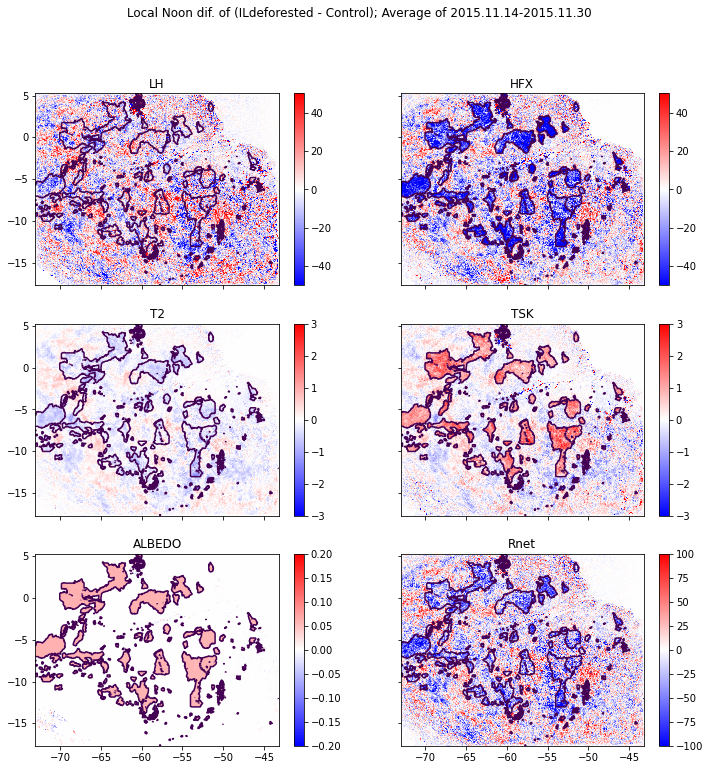

In [6]:
path = '/ocean/projects/ees210014p/xjliu/Amazon_exp/'
#with xarray.open_dataset(path+'Amazon/energyflux_d01_2015-11-01_15:00:00',decode_times=False,
with xarray.open_dataset(path+'Amazon_NoahMP_dveg9/energyflux_d01_201511_15UTC.obs.multidaymean.nc',decode_times=False,
                         mask_and_scale='True') as ds0:
    print('ok')

#with xarray.open_dataset(path+'post_processing/Amazon561x721/energy.201511.obs.nc',decode_times=False,
 #                        mask_and_scale='True') as ds0:
with xarray.open_dataset(path+'Amazon_NoahMP_dveg9_ILgrassland/energyflux_d01_201511_15UTC.ILgrassland.multidaymean.nc',decode_times=False,
                         mask_and_scale='True') as ds1:
                         print('ok')
    
fig,axes = plt.subplots(3,2,figsize=(12,12),sharex=True,sharey=True)
axes = axes.ravel()  
varname = ['LH','HFX','T2','TSK','ALBEDO']

vmins=[-50,-50,-3,-3,-0.2,-100]
vmaxs=[50,50,3,3,0.2,100]
cmaps=['PiYG','PiYG','bwr','coolwarm','bwr','PiYG']
for ii in range(5):
    img = axes[ii].pcolormesh(lons,lats,ds1[varname[ii]].mean('Time')-ds0[varname[ii]].mean('Time'),cmap='bwr',
                             vmin=vmins[ii],vmax=vmaxs[ii])
    fig.colorbar(img,ax=axes[ii])
    axes[ii].set_title(varname[ii])
    axes[ii].contour(lons,lats,lu1-lu0,levels=[1,10])
    
## plot Rnet
Rnet0 = ds0['LH'] + ds0['HFX']
Rnet1 = ds1['LH'] + ds1['HFX']

img = axes[5].pcolormesh(lons,lats,Rnet1.mean('Time')-Rnet0.mean('Time'),vmin=vmins[5],vmax=vmaxs[5],
                       cmap='bwr')

fig.colorbar(img,ax=axes[5])
axes[5].set_title('Rnet')
axes[5].contour(lons,lats,lu1-lu0,levels=[1,10])    

plt.suptitle('Local Noon dif. of (ILdeforested - Control); Average of 2015.11.14-2015.11.30')

## Diurnal cycle

In [53]:
dif = ds1[varname[ii]] - ds0[varname[ii]]
dif_lu = lu1-lu0
dif_forests = dif.where(dif_lu>0)
diurnal_north = dif_forests[:,380:,200:600].mean(('south_north','west_east'))
diurnal_west = dif_forests[0,100:,:200].mean(('south_north','west_east'))
#plt.contourf(dif_forests)


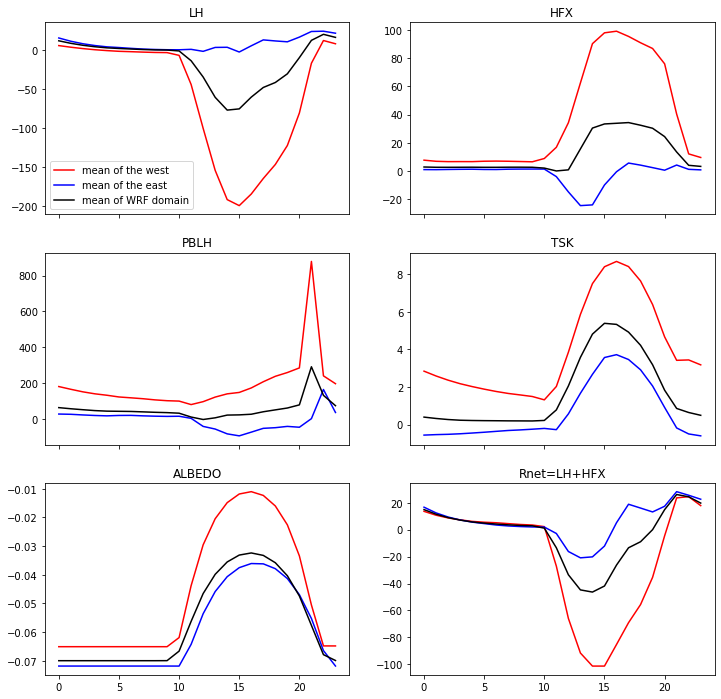

In [70]:
fig,axes = plt.subplots(3,2,figsize=(12,12),sharex=True)
axes = axes.ravel()  
varname = ['LH','HFX','PBLH','TSK','ALBEDO','Rnet=LH+HFX']
for ii in range(5):
    dif = ds1[varname[ii]] - ds0[varname[ii]]
    dif_lu = lu1-lu0
    dif_forests = dif.where(dif_lu>0)
    diurnal_north = dif_forests[:,380:,200:600].mean(('south_north','west_east'))
    diurnal_west = dif_forests[:,100:,:200].mean(('south_north','west_east'))
    diurnal_all = dif_forests.mean(('south_north','west_east'))

    
    axes[ii].plot(range(24),diurnal_north,'-r',label='mean of the west')
    axes[ii].plot(range(24),diurnal_west,'-b',label='mean of the east')
    axes[ii].plot(range(24),diurnal_all,'-k',label='mean of WRF domain')

    axes[ii].set_title(varname[ii])
    
axes[0].legend()
   
## plot Rnet
dif_Rnet = ds1['LH'] + ds1['HFX'] - (ds0['LH'] + ds0['HFX'])
dif_forests = dif_Rnet.where(dif_lu>0)
diurnal_north = dif_forests[:,380:,200:600].mean(('south_north','west_east'))
diurnal_west = dif_forests[:,100:,:200].mean(('south_north','west_east'))
diurnal_all = dif_forests.mean(('south_north','west_east'))
axes[5].plot(range(24),diurnal_north,'-r')
axes[5].plot(range(24),diurnal_west,'-b')
axes[5].plot(range(24),diurnal_all,'-k')
axes[5].set_title(varname[5])

